# Regression Model - Regularization - House Price Prediction
By: Vikram Mathur

# Problem Statement
- Model the price of houses - a regression model using regularisation in order to predict the actual value of the prospective properties
- Determine the features which are significant in predicting the price of a house, and how well these features describe the price of a house.
- Determining the optimal value of lambda for ridge and lasso regression.
 


# Table Of Contents<br/>

[Importing Required Libraries](#SetupEnvironment)<br/><br/>
1. [**Step 1: Reading and Understanding Data**](#RUD)<br/>
    1.1 [Running Pandas Profiler](#RPP)<br/>
    

2. [**Step 2: Data Preparation & EDA**](#DP)<br/>
    2.1 [Removing Redundant Features](#RFCV)<br/>
    > 2.1.1 [Removing Features with Constant Values](#RFCV)<br/>
    > 2.1.2 [Checking & Removing Features with 85%+ Constant Values](#RF99CV)<br/>
    > 2.1.3 [Evaluating ID Features having all Unique values](#RIFUV)<br/>
    > 2.1.4 [Evaluating Features having High missing values](#EFMV)<br/>
    
    2.2 [Check for Duplicates](#CD)<br/>
    2.3 [Check & Treat Missing Values](#CTMV)<br/>
    > 2.3.1 [Remove the ROWS  having some percentage missing values](#RRMV)<br/>
    
    > 2.3.2 [Handling Missing Data for Categorical Variables](#CVMV)<br/>
    >> 2.3.2.1 [Analyzing the Basement Features for Missing Values](#BFMV)<br/>
    > 2.3.2.2 [Analyzing the Garage Features for Missing Values](#GFMV)<br/>
    > 2.3.2.3 [Analyzing the Masonry Features for Missing Values](#MFMV)<br/>
    
    > 2.3.3 [Handling Missing Data for Numerical Features](#CNFMV)<br/>
    
    2.4 [Check & Fix Datatypes](#CFD)<br/>
    2.5 [Derived Features - Year Features into Age](#DFYFA)<br/>
    2.6 [Outlier Analysis & Treatment](#OAT)<br/>
    2.7 [Feature Analysis (Numerical & Categorical) - Dependent Variable with Independent Variables](#FADVIV)<br/>
    2.8 [Numerical Features Analysis](#NFA)
    > 2.8.1 [Numerical Features - Univariate Analysis](#NFUA)<br/>
    > 2.8.2 [Correlation Analysis - Bivariate Analysis](#CA)<br/>
    > 2.8.3 [Numerical Features - Segmented Analysis](#NFSA)
    
    2.9 [Categorical Features Analysis](#CFA)<br/>
    > 2.9.1 [Categorical Features - Univariate Analysis](#CFUA)<br/>

3. [**Step 3: Feature Engineering - Data Preparation**](#FEDP)<br/>
    3.1 [Label Encoding for Ordered Categorical Variables](#LE)<br/>
    3.2 [Dummy Encoding for Unordered Categorical Variables](#DC)<br/>


4. [**Step 4: Split Data into Training and Test Sets**](#split)<br/>


5. [**Step 5: Training the Model**](#train)<br/>
    5.1 [MinMax Scaling](#MMS)<br/>
    5.2 [RFE](#RFE)<br/>
    5.3 [Building model using statsmodel, for the detailed statistics](#STATS)<br/>
    5.4 [Ridge Regression](#Ridge)<br/>
    5.5 [Lasso Regression](#lasso)<br/>


6. [**Step 6: Predictions and Evaluation on the Test Set**](#evaluation)<br/>

<a id="SetupEnvironment"></a>
# Loading Required Libraries

In [1]:
import numpy as np
import pandas as pd

import pandas_profiling as pp # pip install pandas-profiling

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
from sklearn import metrics
from scipy import stats

import math
from datetime import datetime

#Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# View max columns
pd.options.display.max_columns = None

<a id="RUD"></a>
# 1. Reading and Understanding Data

In [2]:
df = pd.read_csv("train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df.shape

(1460, 81)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

 Data Interpretation for dataframe info() 
- There are features having missing value that need to be treated before modelling. Some of these missing value features can be dropped too.

In [5]:
df.describe([0,0.05, 0.25,0.50,0.75,0.90,0.95,0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
0%,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
5%,73.950000,20.000000,34.000000,3311.700000,4.000000,4.000000,1916.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,519.300000,672.950000,0.000000,0.000000,848.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,4.000000,0.000000,1930.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2006.000000,88000.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
90%,1314.100000,120.000000,96.000000,14381.700000,8.000000,7.000000,2006.

 Data Interpretation for dataframe describe 
- There are higher values but they don't seem to be incorrect values.
- Need to plot a box plot to visually check the outliers.

<a id="PP"></a>
### 1.1 Running Pandas Profiler

Executing profiler and analyzing results.<br/>
Note: The profiler execution will take time. Kindly wait for the processing to complete.

In [6]:
profile = pp.ProfileReport(df)
# Generate HTML file for easy viewing for later
profile.to_file(outputfile="df_profile.html")
profile

Number of variables,81
Number of observations,1460
Total Missing (%),5.9%
Total size in memory,924.0 KiB
Average record size in memory,648.1 B
Numeric,38
Categorical,43
Boolean,0
Date,0
Text (Unique),0
Rejected,0


<a id="DP"></a>
# 2. Data Preparation & EDA

<a id="RRF"></a>
<a id="RFCV"></a>
### 2.1 Removing Redundant Features
#### 2.1.1 Removing Features with Constant Values
 - There are features having a higher percentage of constant values. But no feature with 100% constant value.
 - Next step to check features with 85% constant value and above.

<a id="RF99CV"></a>
#### 2.1.2 Removing Features with 85% Constant Value
 - Pandas Profiler suggests the following featuers having a constant value frequency of 85%. Hence we can remove these features. Checking the business sense of these features to take a decision
    1. **_3SsnPorch_** has 98.4% "zero" values
    - **_BsmtCond_** has 89.8% ~ 90%  "TA" values
    - **_BsmtFinType2_** has 86.03% values as Unf
    - **_BsmtFinSF2_** has 88.6% "zero" values
    - **_BsmtHalfBath_** has 94.4% "zero" values
    - **_CentralAir_** has 93.5% "Y" values
    - **_Condition1_** has 86.3% values as Norm
    - **_Condition2_** has 99.0% "Norm" values
    - **_Electrical_** has 91.4% "SBrkr" values
    - **_EnclosedPorch_** has 85.8% "zero" values
    - **_ExterCond_** has 97.81% values as TA
    - **_Functional_** has 93.2% "Typ" values
    - **_GarageCond_** has 90.8% "TA" values
    - **_GarageQual_** has 89.8% ~ 90% "TA" values
    - **_Heating_** has 97.8% "GasA" values
    - **_KitchenAbvGr_** has 95.3% "1" values
    - **_LandContour_** has 89.8% ~ 90% "Lvl" values
    - **_LandSlope_** has 94.7% "Gtl" values
    - **_LowQualFinSF_** has 98.2% "0" values
    - **_MiscVal_** has 96.4% "0" values
    - **_PavedDrive_** has 91.8% "Y" values
    - **_PoolArea_** has 99.5% "0" values
    - **_RoofMatl_** has 98.2% "CompShg" values
    - **_ScreenPorch_** has 92.1% "0" values
    - **_SaleType_** has 86.78% values as WD
    - **_Street_** has 99.6% "Pave" values
    - **_Utilities_** has 99.9% "AllPub" values

In [7]:
const_features_85_lst = ['3SsnPorch','BsmtCond','BsmtFinSF2','BsmtHalfBath','CentralAir','Condition2',
                         'Electrical','EnclosedPorch','Functional','GarageCond','GarageQual','Heating',
                         'KitchenAbvGr','LandContour','LandSlope','LowQualFinSF','MiscVal','PavedDrive',
                         'PoolArea','RoofMatl','ScreenPorch','Street','Utilities', 'SaleType','Condition1',
                         'BsmtFinType2','ExterCond']

df.drop(const_features_85_lst, axis=1, inplace= True)

<a id="RIFUV"></a>
#### 2.1.3 Evaluating ID Features having all Unique values
 - ID Column is the only feature having all unique values.

<a id="EFMV"></a>
#### 2.1.4 Evaluating Features having High missing values

In [8]:
# Missing values
round((df.isnull().sum()/len(df)) * 100,0)

Id                 0.0
MSSubClass         0.0
MSZoning           0.0
LotFrontage       18.0
LotArea            0.0
Alley             94.0
LotShape           0.0
LotConfig          0.0
Neighborhood       0.0
BldgType           0.0
HouseStyle         0.0
OverallQual        0.0
OverallCond        0.0
YearBuilt          0.0
YearRemodAdd       0.0
RoofStyle          0.0
Exterior1st        0.0
Exterior2nd        0.0
MasVnrType         1.0
MasVnrArea         1.0
ExterQual          0.0
Foundation         0.0
BsmtQual           3.0
BsmtExposure       3.0
BsmtFinType1       3.0
BsmtFinSF1         0.0
BsmtUnfSF          0.0
TotalBsmtSF        0.0
HeatingQC          0.0
1stFlrSF           0.0
2ndFlrSF           0.0
GrLivArea          0.0
BsmtFullBath       0.0
FullBath           0.0
HalfBath           0.0
BedroomAbvGr       0.0
KitchenQual        0.0
TotRmsAbvGrd       0.0
Fireplaces         0.0
FireplaceQu       47.0
GarageType         6.0
GarageYrBlt        6.0
GarageFinish       6.0
GarageCars 

 Data Interpretation of Missing values in Columns 
 -  Removing columns having High missing values
 - Following columns to be dropped for having more than 30% missing values
    - Alley
    - FireplaceQu
    - PoolQC
    - Fence
    - MiscFeature

In [9]:
df.drop(['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis=1, inplace= True)

In [10]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Reg,Inside,CollgCr,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,No,GLQ,706,150,856,Ex,856,854,1710,1,2,1,3,Gd,8,0,Attchd,2003.0,RFn,2,548,0,61,2,2008,Normal,208500
1,2,20,RL,80.0,9600,Reg,FR2,Veenker,1Fam,1Story,6,8,1976,1976,Gable,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,Gd,ALQ,978,284,1262,Ex,1262,0,1262,0,2,0,3,TA,6,1,Attchd,1976.0,RFn,2,460,298,0,5,2007,Normal,181500
2,3,60,RL,68.0,11250,IR1,Inside,CollgCr,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,Mn,GLQ,486,434,920,Ex,920,866,1786,1,2,1,3,Gd,6,1,Attchd,2001.0,RFn,2,608,0,42,9,2008,Normal,223500
3,4,70,RL,60.0,9550,IR1,Corner,Crawfor,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,No,ALQ,216,540,756,Gd,961,756,1717,1,1,0,3,Gd,7,1,Detchd,1998.0,Unf,3,642,0,35,2,2006,Abnorml,140000
4,5,60,RL,84.0,14260,IR1,FR2,NoRidge,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,Av,GLQ,655,490,1145,Ex,1145,1053,2198,1,2,1,4,Gd,9,1,Attchd,2000.0,RFn,3,836,192,84,12,2008,Normal,250000


In [11]:
df.shape

(1460, 49)

<a id="CD"></a>
### 2.2 Check for Duplicates

In [12]:
#Checking for Duplicates in dataframe
print(df.duplicated().value_counts())

False    1460
dtype: int64


In [13]:
#Checking for Duplicates without the ID column
print(df.drop('Id',axis=1).duplicated().value_counts())

False    1460
dtype: int64


 Data Interpretation of Duplicates 
- There are no duplicate rows in the dataset

<a id="CTMV"></a>
### 2.3 Check & Treat Missing Values

<a id="RRMV"></a>
#### 2.3.1 Remove the ROWS  having some percentage missing values

In [14]:
# count the number of rows having >=30% missing values
print("30% missing values")
print("Count:", len(df[df.isnull().sum(axis=1) >= len(df.columns)*0.3].index))
print("Percentage:", round(100*(len(df[df.isnull().sum(axis=1) >= len(df.columns)*0.3].index) / len(df.index)),2),"%")

30% missing values
Count: 0
Percentage: 0.0 %


 Data Interpretation of Missing values in Rows 
- There are no rows having more than 30% missing values

<a id="CVMV"></a>
#### 2.3.2 Handling Missing Data for Categorical Variables

In [15]:
#selecting numerical variables
numerical_features = list(df.select_dtypes(include=['int64','float64']).columns)
numerical_features = list(set(numerical_features) - set(['Id']))
print("Numerical Columns: ", numerical_features)

#selecting categorical vairables
categorical_features = list(df.select_dtypes(include='object').columns)
print("\nCategorical Columns: ", categorical_features)

Numerical Columns:  ['BedroomAbvGr', 'GarageCars', 'BsmtFullBath', 'BsmtFinSF1', 'BsmtUnfSF', 'Fireplaces', 'OverallQual', 'MasVnrArea', 'YrSold', 'SalePrice', 'LotArea', 'YearRemodAdd', 'HalfBath', 'WoodDeckSF', 'MSSubClass', 'YearBuilt', 'MoSold', 'TotalBsmtSF', 'TotRmsAbvGrd', 'OpenPorchSF', '2ndFlrSF', 'FullBath', '1stFlrSF', 'LotFrontage', 'GrLivArea', 'GarageArea', 'OverallCond', 'GarageYrBlt']

Categorical Columns:  ['MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'GarageType', 'GarageFinish', 'SaleCondition']


In [16]:
lst_nullval_feat = df.columns[df.isnull().any()]
lst_nullval_feat = list(set(lst_nullval_feat).intersection(set(categorical_features)))
print("Categorical Features having Null Values:", lst_nullval_feat)

Categorical Features having Null Values: ['GarageFinish', 'MasVnrType', 'BsmtExposure', 'BsmtFinType1', 'GarageType', 'BsmtQual']


 Data Interpretation of Missing Values in Categorical Variables 
- There seems to be a business perspective behind Basement, Garage and Masonry reated Featues. The reason is that:
    - All Basement Features have 3% missing data
    - All Garage Featues have 6% missing data
    - All Masonry Features have 1% missing data

<a id="BFMV"></a>
##### 2.3.2.1 Analyzing the Basement Features for Missing Values
- Basement related features have 3% missing data. 
- This may suggest that these 3% features indicate No Basement. This needs to be analyzed.
- The value of NA for BsmtQual suggests that there is no basement as per the data dictionary.

In [17]:
df.BsmtQual.unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

An indication that nan may actually be NA - No Basement

In [18]:
# Viewing Basement Related Features
bsmt_features = []
for i in df.columns:
    if (i.lower().find('bsmt') != -1):
        bsmt_features.append(i)

# Checking the dataset for TotalBsmtSF = 0. This would suggest there is no Basement
df[bsmt_features].query('TotalBsmtSF == 0')

,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,BsmtFullBath
17,NaN,NaN,NaN,0,0,0,0
39,NaN,NaN,NaN,0,0,0,0
90,NaN,NaN,NaN,0,0,0,0
102,NaN,NaN,NaN,0,0,0,0
156,NaN,NaN,NaN,0,0,0,0
182,NaN,NaN,NaN,0,0,0,0
259,NaN,NaN,NaN,0,0,0,0
342,NaN,NaN,NaN,0,0,0,0
362,NaN,NaN,NaN,0,0,0,0
371,NaN,NaN,NaN,0,0,0,0


 Data Interpretation of Missing Values of Basement Features 
- The nan values appear for properties having No Basement
- The missing values of all categorical Basement Variables should be imputed to 'NA' as per the data dictionary

In [19]:
# Replacing missing values with "NA" value based on analysis done on Basement Features
df['BsmtExposure'].fillna('NA',inplace=True)
df['BsmtFinType1'].fillna('NA',inplace=True)
df['BsmtQual'].fillna('NA',inplace=True)

<a id="GFMV"></a>
##### 2.3.2.2 Analyzing the Garage Features for Missing Values
- Basement related features have 6% missing data. 
- This may suggest that these 6% features indicate No Garage. This needs to be analyzed.
- The value of NA for Garage Categorical Features suggests that there is no garage as per the data dictionary.

In [20]:
df.GarageType.unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

An indication that nan may actually be NA - No Garage

In [21]:
# Viewing Garage Related Features
garage_features = []
for i in df.columns:
    if (i.lower().find('garage') != -1):
        garage_features.append(i)

# Checking the dataset for GarageArea = 0. This would suggest there is no Garage
df[garage_features].query('GarageArea == 0')

,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea
39,NaN,NaN,NaN,0,0
48,NaN,NaN,NaN,0,0
78,NaN,NaN,NaN,0,0
88,NaN,NaN,NaN,0,0
89,NaN,NaN,NaN,0,0
99,NaN,NaN,NaN,0,0
108,NaN,NaN,NaN,0,0
125,NaN,NaN,NaN,0,0
127,NaN,NaN,NaN,0,0
140,NaN,NaN,NaN,0,0


 Data Interpretation of Missing Values of Garage Features 
- The nan values appear for properties having No Garage
- The missing values of all categorical Garage Variables should be imputed to 'NA' as per the data dictionary
- GarageYrBlt 
    - Can't be imputed with 0 as that would be incorrect information
    - For GarageYrBlt feature should be derived into Age Feature.
    - The Age Feature would be computed based on current year (2019 - GarageYrBlt)
    - For these 81 missing values we should impute with either mode or median - To be decided while working with numerical features

In [22]:
# Replacing missing values with "NA" value based on analysis done on Garage Features
df['GarageFinish'].fillna('NA',inplace=True)
df['GarageType'].fillna('NA',inplace=True)

<a id="MFMV"></a>
##### 2.3.2.3 Analyzing the Masonry Features for Missing Values
- Basement related features have 1% missing data. 
- This may suggest that these 1% features indicate No Masonry Area. This needs to be analyzed.
- The value of none for Masonry Categorical Features suggests that there is no Masonry Area as per the data dictionary.

In [23]:
df.MasVnrType.unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

An indication that nan may actually be none - No Masonry Area

In [24]:
# Viewing Garage Related Features
masonry_features = []
for i in df.columns:
    if (i.lower().find('masvnr') != -1):
        masonry_features.append(i)

# Checking the dataset for MasVnrArea = 0. This would suggest there is no Masonry Area
df[masonry_features][df[masonry_features].isnull().any(axis=1)]

,MasVnrType,MasVnrArea
234,NaN,NaN
529,NaN,NaN
650,NaN,NaN
936,NaN,NaN
973,NaN,NaN
977,NaN,NaN
1243,NaN,NaN
1278,NaN,NaN


 Data Interpretation of Missing Values of Masonry Features 
- The nan values appear for properties having No Masonry Area
- The missing values of all categorical Masonry Variables should be imputed to 'None' as per the data dictionary
- For the numerical feature (MasVnrArea) it should be imputed with 0, indicating no Masonry Area

In [25]:
# Replacing missing values with "None" value based on analysis done on Masonry Features
# Imputing missing value of numerical masonry feature with 0
df['MasVnrType'].fillna('None',inplace=True)
df['MasVnrArea'].fillna(0,inplace=True)

In [26]:
# Missing values
round((df.isnull().sum()/len(df)) * 100,0)

Id                0.0
MSSubClass        0.0
MSZoning          0.0
LotFrontage      18.0
LotArea           0.0
LotShape          0.0
LotConfig         0.0
Neighborhood      0.0
BldgType          0.0
HouseStyle        0.0
OverallQual       0.0
OverallCond       0.0
YearBuilt         0.0
YearRemodAdd      0.0
RoofStyle         0.0
Exterior1st       0.0
Exterior2nd       0.0
MasVnrType        0.0
MasVnrArea        0.0
ExterQual         0.0
Foundation        0.0
BsmtQual          0.0
BsmtExposure      0.0
BsmtFinType1      0.0
BsmtFinSF1        0.0
BsmtUnfSF         0.0
TotalBsmtSF       0.0
HeatingQC         0.0
1stFlrSF          0.0
2ndFlrSF          0.0
GrLivArea         0.0
BsmtFullBath      0.0
FullBath          0.0
HalfBath          0.0
BedroomAbvGr      0.0
KitchenQual       0.0
TotRmsAbvGrd      0.0
Fireplaces        0.0
GarageType        0.0
GarageYrBlt       6.0
GarageFinish      0.0
GarageCars        0.0
GarageArea        0.0
WoodDeckSF        0.0
OpenPorchSF       0.0
MoSold    

<a id="CNFMV"></a>
#### 2.3.3 Handling Missing Data for Numerical Features

In [27]:
# Custom function for plotting histogram
def histogram(df, col_name):
    plt.figure(figsize=(6,3))
    plt.hist(df[col_name],alpha=0.7, ec='black')
    plt.xlabel(col_name)
    plt.ylabel('frequency')
    plt.title(col_name + ' Frequency')
    plt.plot()

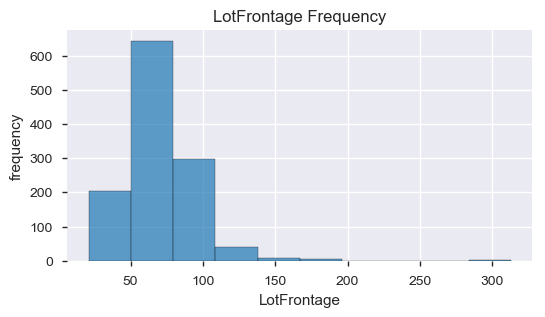

In [28]:
histogram(df, 'LotFrontage')

In [29]:
df.LotFrontage.value_counts()

60.0     143
70.0      70
80.0      69
50.0      57
75.0      53
65.0      44
85.0      40
78.0      25
21.0      23
90.0      23
68.0      19
24.0      19
64.0      19
73.0      18
72.0      17
79.0      17
63.0      17
55.0      17
100.0     16
51.0      15
66.0      15
74.0      15
52.0      14
59.0      13
71.0      12
82.0      12
40.0      12
43.0      12
67.0      12
57.0      12
        ... 
129.0      2
124.0      2
118.0      2
101.0      2
122.0      2
121.0      2
115.0      2
109.0      2
116.0      2
114.0      2
150.0      1
111.0      1
153.0      1
182.0      1
46.0       1
112.0      1
149.0      1
141.0      1
33.0       1
152.0      1
160.0      1
168.0      1
128.0      1
144.0      1
39.0       1
106.0      1
38.0       1
138.0      1
140.0      1
137.0      1
Name: LotFrontage, Length: 110, dtype: int64

 Data Interpretation of LotFrontage Histogram 
- The feature seems to be a continuous numerical feature and the missing values should be replaced with median
- Also, the LotFrontage (Linear feet of street connected to property) seems to be a feature which could potentially be binned.

In [30]:
df['LotFrontage'].fillna(df['LotFrontage'].median(),inplace=True)

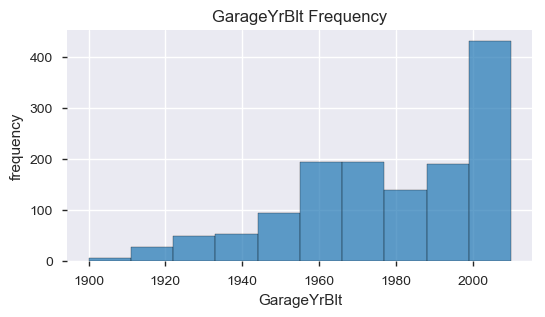

In [31]:
histogram(df, 'GarageYrBlt')

 Data Interpretation of GarageYrBlt Histogram 
- The feature is a discrete numerical feature as we are only considering the Years.
- Also, the GarageYrBlt seems to be a feature which could be derived into Age Feature and maybe binned.
- _Ideally the nan values in this feature depicts that there is No Garage in the property. However, if we impute by 0 then that would become an outlier value. Since, there are only 6% / 81 values which are nan's imputing with mean._

In [32]:
df['GarageYrBlt'].fillna(df['GarageYrBlt'].mean(),inplace=True)

In [33]:
# missing values
round((df.isnull().sum()/len(df)) * 100,1)

Id               0.0
MSSubClass       0.0
MSZoning         0.0
LotFrontage      0.0
LotArea          0.0
LotShape         0.0
LotConfig        0.0
Neighborhood     0.0
BldgType         0.0
HouseStyle       0.0
OverallQual      0.0
OverallCond      0.0
YearBuilt        0.0
YearRemodAdd     0.0
RoofStyle        0.0
Exterior1st      0.0
Exterior2nd      0.0
MasVnrType       0.0
MasVnrArea       0.0
ExterQual        0.0
Foundation       0.0
BsmtQual         0.0
BsmtExposure     0.0
BsmtFinType1     0.0
BsmtFinSF1       0.0
BsmtUnfSF        0.0
TotalBsmtSF      0.0
HeatingQC        0.0
1stFlrSF         0.0
2ndFlrSF         0.0
GrLivArea        0.0
BsmtFullBath     0.0
FullBath         0.0
HalfBath         0.0
BedroomAbvGr     0.0
KitchenQual      0.0
TotRmsAbvGrd     0.0
Fireplaces       0.0
GarageType       0.0
GarageYrBlt      0.0
GarageFinish     0.0
GarageCars       0.0
GarageArea       0.0
WoodDeckSF       0.0
OpenPorchSF      0.0
MoSold           0.0
YrSold           0.0
SaleCondition

All Missing values treated

In [34]:
df.reset_index(drop=True,inplace=True)

In [35]:
df.shape

(1460, 49)

In [36]:
#Re-running the profiler to view / review post the clean up
profile = pp.ProfileReport(df)
profile

Number of variables,49
Number of observations,1460
Total Missing (%),0.0%
Total size in memory,559.0 KiB
Average record size in memory,392.1 B
Numeric,29
Categorical,20
Boolean,0
Date,0
Text (Unique),0
Rejected,0


##### Checking Features having Zero values for Null's
Checking to see if they are null's or if they add meaning to the dataset. From the profiler we have the following information:
- 2ndFlrSF has 829 / 56.8% zeros Zeros ==> Zeros would suggest that the property does not have a 2nd Floor
- BsmtFinSF1 has 467 / 32.0% zeros Zeros ==> Zeros would suggest that the property does not have a Type 1 finished BsmtFinSF1.
- BsmtFullBath has 856 / 58.6% zeros Zeros ==> Zeros would suggest that the property does not have any Basement Full Bathrooms
- BsmtUnfSF has 118 / 8.1% zeros Zeros ==> Unfinished square feet of basement area would be 0. Suggesting there may not be a basement in the property.
- Fireplaces has 690 / 47.3% zeros Zeros ==> Zero means no fireplace
- GarageArea has 81 / 5.5% zeros Zeros ==> Zero means no Garage
- GarageCars has 81 / 5.5% zeros Zeros ==> Zero means no Garage
- HalfBath has 913 / 62.5% zeros Zeros ==> No half baths
- MasVnrArea has 869 / 59.5% zeros Zeros ==> No masonry veener area
- OpenPorchSF has 656 / 44.9% zeros Zeros ==> No Open Porch Area
- TotalBsmtSF has 37 / 2.5% zeros Zeros ==> No Basement
- WoodDeckSF has 761 / 52.1% zeros Zeros ==> No Wood Dec Area

None of the above features seems to require any treatment of data

<a id="CFD"></a>
### 2.4 Check & Fix Data Types

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 49 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1460 non-null float64
LotArea          1460 non-null int64
LotShape         1460 non-null object
LotConfig        1460 non-null object
Neighborhood     1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
Exterior1st      1460 non-null object
Exterior2nd      1460 non-null object
MasVnrType       1460 non-null object
MasVnrArea       1460 non-null float64
ExterQual        1460 non-null object
Foundation       1460 non-null object
BsmtQual         1460 non-null object
BsmtExposure     1460 non-null object
BsmtFinType1     1460 no

 Data Interpretation for Data Type 
- No Change of data type needed for the features post removal.
- A dropped feature CentralAir should have been converted to boolean. But the feature was dropped due to high constant value of Yes.

<a id="DFYFA"></a>
### 2.5 Derived Features - Year Features into Age

##### Garage Built Year

In [38]:
# Get Current Year
currentYear = datetime.now().year

# Year difference between currentYear and GarageYrBlt
df['GarageBltAge'] = currentYear - df['GarageYrBlt']
df['GarageBltAge'] = df['GarageBltAge'].astype('int')
df[['GarageYrBlt','GarageBltAge']].head()

,GarageYrBlt,GarageBltAge
0,2003.0,16
1,1976.0,43
2,2001.0,18
3,1998.0,21
4,2000.0,19


In [39]:
# Dropping the Year feature
df.drop('GarageYrBlt', axis=1, inplace=True)

##### Property Age

In [40]:
df['PropertyAge'] = currentYear - df['YearBuilt']
df['PropertyAge'] = df['PropertyAge'].astype('int')
df[['YearBuilt','PropertyAge']].head()

,YearBuilt,PropertyAge
0,2003,16
1,1976,43
2,2001,18
3,1915,104
4,2000,19


In [41]:
# Dropping the Year feature
df.drop('YearBuilt', axis=1, inplace=True)

##### Property Remodelling and Addition Age

In [42]:
df['PropertyRemodAddAge'] = currentYear - df['YearRemodAdd']
df['PropertyRemodAddAge'] = df['PropertyRemodAddAge'].astype('int')
df[['YearRemodAdd','PropertyRemodAddAge']].head()

,YearRemodAdd,PropertyRemodAddAge
0,2003,16
1,1976,43
2,2002,17
3,1970,49
4,2000,19


In [43]:
# Dropping the Year feature
df.drop('YearRemodAdd', axis=1, inplace=True)

##### Selling Age

In [44]:
df['SaleAge'] = currentYear - df['YrSold']
df['SaleAge'] = df['SaleAge'].astype('int')
df[['YrSold','SaleAge']].head()

,YrSold,SaleAge
0,2008,11
1,2007,12
2,2008,11
3,2006,13
4,2008,11


In [45]:
df.drop('YrSold', axis=1, inplace=True)

<a id="OAT"></a>
### 2.6 Outlier Analysis & Treatment

In [46]:
#selecting numerical variables
numerical_features = list(df.select_dtypes(include=['int16','int32','int64','float64']).columns)
numerical_features = list(set(numerical_features) - set(['Id']))
print("Numerical Features: ", numerical_features)

#selecting categorical vairables
categorical_features = list(df.select_dtypes(include='object').columns)
print("\nCategorical Features: ", categorical_features)

Numerical Features:  ['BedroomAbvGr', 'GarageCars', 'BsmtFullBath', 'BsmtFinSF1', 'BsmtUnfSF', 'Fireplaces', 'OverallQual', 'MasVnrArea', 'SalePrice', 'LotArea', 'HalfBath', 'WoodDeckSF', 'MSSubClass', 'SaleAge', 'MoSold', 'PropertyAge', 'TotalBsmtSF', 'TotRmsAbvGrd', 'OpenPorchSF', '2ndFlrSF', 'FullBath', '1stFlrSF', 'LotFrontage', 'GarageBltAge', 'GrLivArea', 'GarageArea', 'OverallCond', 'PropertyRemodAddAge']

Categorical Features:  ['MSZoning', 'LotShape', 'LotConfig', 'Neighborhood', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual', 'GarageType', 'GarageFinish', 'SaleCondition']


- **_Continuous and Discrete Numerical Features_**
    - From the list of numerical features, certain features are discrete and some are also Ordered variables. 
    - Creating a separate list for these features and removing them from Numerical Features.
    - The Discrete Numerical Features are:
        - MSSubClass (Nominal Categorical Variable Values in multiple of 10s ==> 20, 30, 40 to 190. Unordered)
        - OverallCond (Ordered Categorical Feature 1 to 10)
        - BedroomAbvGr (Dataset ranges from 0 to 8. Ordered)
        - GarageCars (Dataset has values 0 to 4. Ordered)
        - TotRmsAbvGrd (Dataset ranges from 2 to 14. Ordered)
        - OverallQual (Ordered Categorical Feature 1 to 10)
        - Fireplaces (Dataset ranges form 0 to 3. Ordered)
        - FullBath (Dataset ranges from 0 to 3. Ordered)
        - HalfBath (Dataset ranges from 0 to 2. Ordered)
        - BsmtFullBath (Dataset ranges from 0 to 3. Ordered)<br/><br/>
        
        - SaleAge (Ideally age is continuous, here howerver it's not in decimals so its more of Discrete values)
        - GarageBltAge (Ideally age is continuous, here howerver it's not in decimals so its more of Discrete values)
        - PropertyAge (Ideally age is continuous, here howerver it's not in decimals so its more of Discrete values)
        - PropertyRemodAddAge (Ideally age is continuous, here howerver it's not in decimals so its more of Discrete values)

In [47]:
ordered_categorical_features = ['OverallCond', 'BedroomAbvGr', 'GarageCars', 'TotRmsAbvGrd',
                                'OverallQual', 'Fireplaces', 'BsmtFullBath','FullBath','HalfBath','MoSold']

age_features = ['SaleAge','GarageBltAge', 'PropertyAge', 'PropertyRemodAddAge']

numerical_features = list(set(numerical_features) - set(ordered_categorical_features))

#MSSubClass is not an ordered Categorical Feature. Need to be added to the categorical Features list
numerical_features.remove('MSSubClass')
categorical_features.append('MSSubClass')

categorical_features.sort()
ordered_categorical_features.sort()
age_features.sort()
numerical_features.sort()

print("Ordered Categorical Features: ", ordered_categorical_features)
print("\nNumerical Features: ", numerical_features)

Ordered Categorical Features:  ['BedroomAbvGr', 'BsmtFullBath', 'Fireplaces', 'FullBath', 'GarageCars', 'HalfBath', 'MoSold', 'OverallCond', 'OverallQual', 'TotRmsAbvGrd']

Numerical Features:  ['1stFlrSF', '2ndFlrSF', 'BsmtFinSF1', 'BsmtUnfSF', 'GarageArea', 'GarageBltAge', 'GrLivArea', 'LotArea', 'LotFrontage', 'MasVnrArea', 'OpenPorchSF', 'PropertyAge', 'PropertyRemodAddAge', 'SaleAge', 'SalePrice', 'TotalBsmtSF', 'WoodDeckSF']


In [48]:
df[numerical_features].describe([0,0.05, 0.25,0.50,0.75,0.90,0.95,0.99])

,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtUnfSF,GarageArea,GarageBltAge,GrLivArea,LotArea,LotFrontage,MasVnrArea,OpenPorchSF,PropertyAge,PropertyRemodAddAge,SaleAge,SalePrice,TotalBsmtSF,WoodDeckSF
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,1162.626712,346.992466,443.639726,567.240411,472.980137,40.466438,1515.463699,10516.828082,69.863699,103.117123,46.660274,47.732192,34.134247,11.184247,180921.195890,1057.429452,94.244521
std,386.587738,436.528436,456.098091,441.866955,213.804841,23.994850,525.480383,9981.264932,22.027677,180.731373,66.256028,30.202904,20.645407,1.328095,79442.502883,438.705324,125.338794
min,334.000000,0.000000,0.000000,0.000000,0.000000,9.000000,334.000000,1300.000000,21.000000,0.000000,0.000000,9.000000,9.000000,9.000000,34900.000000,0.000000,0.000000
0%,334.000000,0.000000,0.000000,0.000000,0.000000,9.000000,334.000000,1300.000000,21.000000,0.000000,0.000000,9.000000,9.000000,9.000000,34900.000000,0.000000,0.000000
5%,672.950000,0.000000,0.000000,0.000000,0.000000,12.000000,848.000000,3311.700000,35.950000,0.000000,0.000000,12.000000,12.000000,9.000000,88000.000000,519.300000,0.000000
25%,882.000000,0.000000,0.000000,223.000000,334.500000,18.000000,1129.500000,7553.500000,60.000000,0.000000,0.000000,19.000000,15.000000,10.000000,129975.000000,795.750000,0.000000
50%,1087.000000,0.000000,383.500000,477.500000,480.000000,40.000000,1464.000000,9478.500000,69.000000,0.000000,25.000000,46.000000,25.000000,11.000000,163000.000000,991.500000,0.000000
75%,1391.250000,728.000000,712.250000,808.000000,576.000000,57.000000,1776.750000,11601.500000,79.000000,164.250000,68.000000,65.000000,52.000000,12.000000,214000.000000,1298.250000,168.000000
90%,1680.000000,954.200000,1065.500000,1232.000000,757.100000,71.000000,2158.300000,14381.700000,92.000000,335.000000,130.000000,94.100000,69.000000,13.000000,278000.000000,1602.200000,262.000000


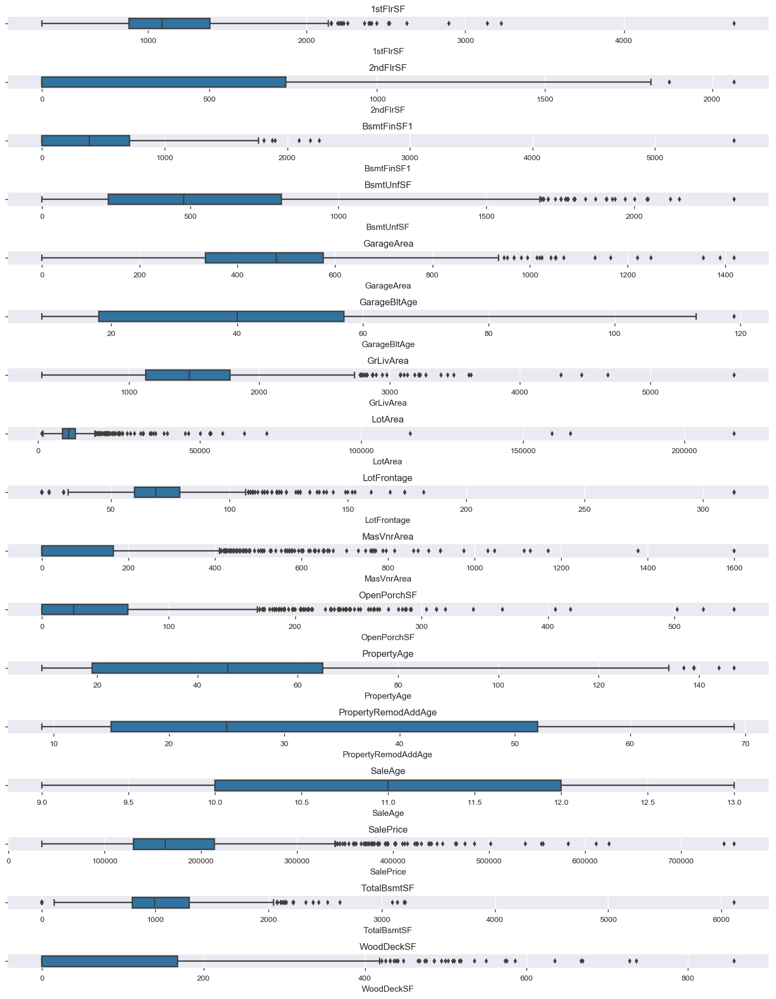

In [49]:
# Generic function to plot outliers based on dataframe and numeric columns
def check_outliers_continuous(df, cols):
    f, ax = plt.subplots(nrows=len(cols), figsize=(14,len(cols)+1))
    for i in range(0,len(cols)):
        sns.boxplot(df[cols[i]].dropna(), ax=ax[i])
        ax[i].title.set_text(cols[i])
    plt.tight_layout()
    plt.show()
    
check_outliers_continuous(df, numerical_features)

In [50]:
def treat_outliers(df, col):
    q1, q3 = np.percentile(df[col].dropna(), [5, 95])
    iqr = q3 - q1
    lower_bound = q1 - (iqr * 1.5)
    upper_bound = q3 + (iqr * 1.5)
    #print(col, lower_bound, upper_bound)
    df[col][df[col] <= lower_bound] = lower_bound
    df[col][df[col] >= upper_bound] = upper_bound

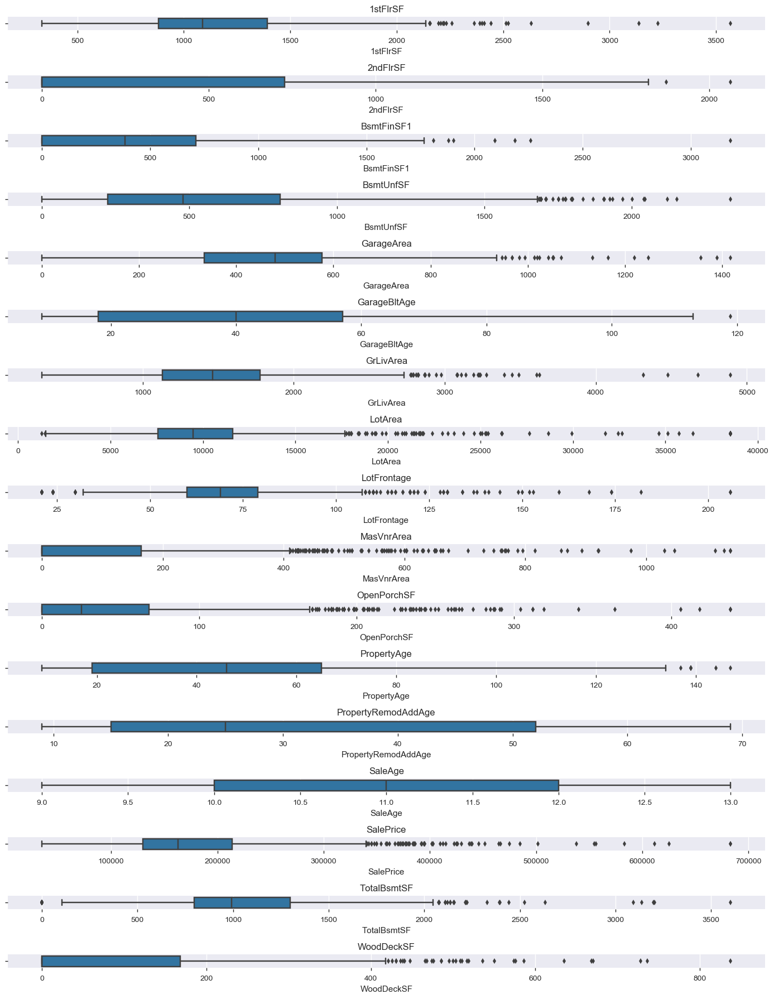

In [51]:
for i in numerical_features:
    treat_outliers(df, i)

check_outliers_continuous(df, numerical_features)

<a id="FADVIV"></a>
### 2.7 Feature Analysis (Numerical & Categorical) - Dependent Variable with Independent Variables

#### Analyzing SalePrice dependent variable

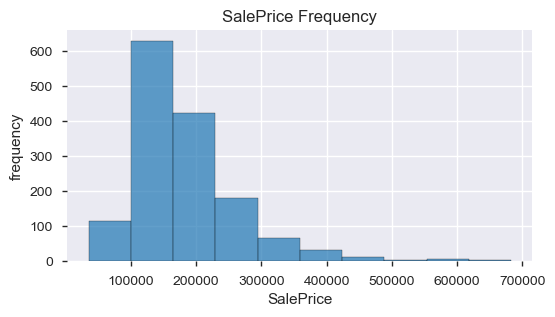

In [52]:
histogram(df,'SalePrice')

 Data Interpretation for Sale Price Histogram 
- Typically the price ranges between 100000 to 200000

In [53]:
# Printing the correlation with SalePrice
print(round(df[numerical_features].corr()['SalePrice']*100))

1stFlrSF                62.0
2ndFlrSF                32.0
BsmtFinSF1              40.0
BsmtUnfSF               22.0
GarageArea              63.0
GarageBltAge           -47.0
GrLivArea               71.0
LotArea                 39.0
LotFrontage             35.0
MasVnrArea              47.0
OpenPorchSF             32.0
PropertyAge            -53.0
PropertyRemodAddAge    -51.0
SaleAge                  3.0
SalePrice              100.0
TotalBsmtSF             64.0
WoodDeckSF              33.0
Name: SalePrice, dtype: float64


In [54]:
numerical_features.remove('SalePrice')

##### Visualizing numerical features (Independent Variables) with SalePrice (Dependent Variable)

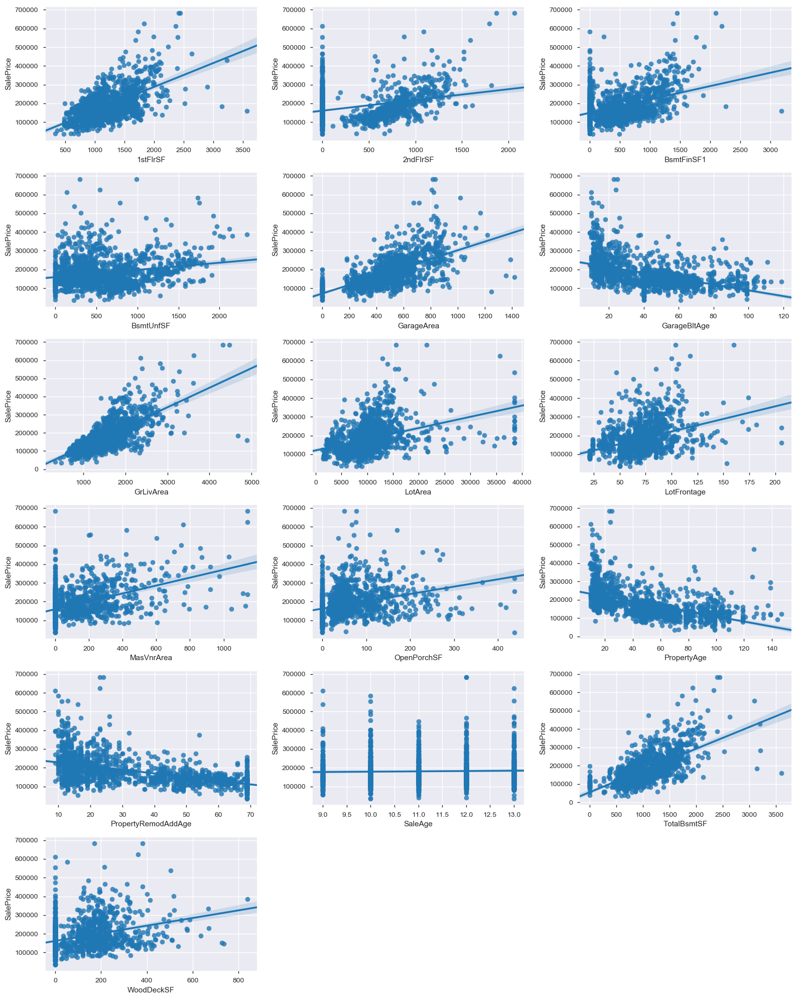

In [55]:
# Plotting
rows = math.ceil(len(numerical_features) / 3)
plt.figure(figsize=(16,20))
for i in range(0,len(numerical_features)):
    plt.subplot(rows, 3, i+1)
    sns.regplot(x=numerical_features[i],y='SalePrice',data=df)
plt.tight_layout()
plt.show()

 Data Interpretation for Numerical Independent Variables with Dependent Variable  
- PropertyRemodAddAge, PropertyAge, GarageBltAge have a negative correlation with SalePrice
- 2ndFlrSF, MasVnrArea, GarageArea, BsmtUnfSF, GrLivArea, WoodDeckSF, LotArea, BsmtFinSF1, TotalBsmtSF, LotFrontage, OpenPorchSF, 1stFlrSF have a positive correlation with SalePrice
- SaleAge does not seem to have a correlation with SalePrice

##### Visualizing Ordered Categorical Variables (Independent Variables) with SalePrice (Dependent Variable)

In [56]:
# Printing the correlation with SalePrice
corrList = ordered_categorical_features.copy()
corrList.append('SalePrice')
print(round(df[corrList].corr()['SalePrice']*100))

BedroomAbvGr     17.0
BsmtFullBath     23.0
Fireplaces       47.0
FullBath         56.0
GarageCars       64.0
HalfBath         28.0
MoSold            5.0
OverallCond      -8.0
OverallQual      79.0
TotRmsAbvGrd     54.0
SalePrice       100.0
Name: SalePrice, dtype: float64


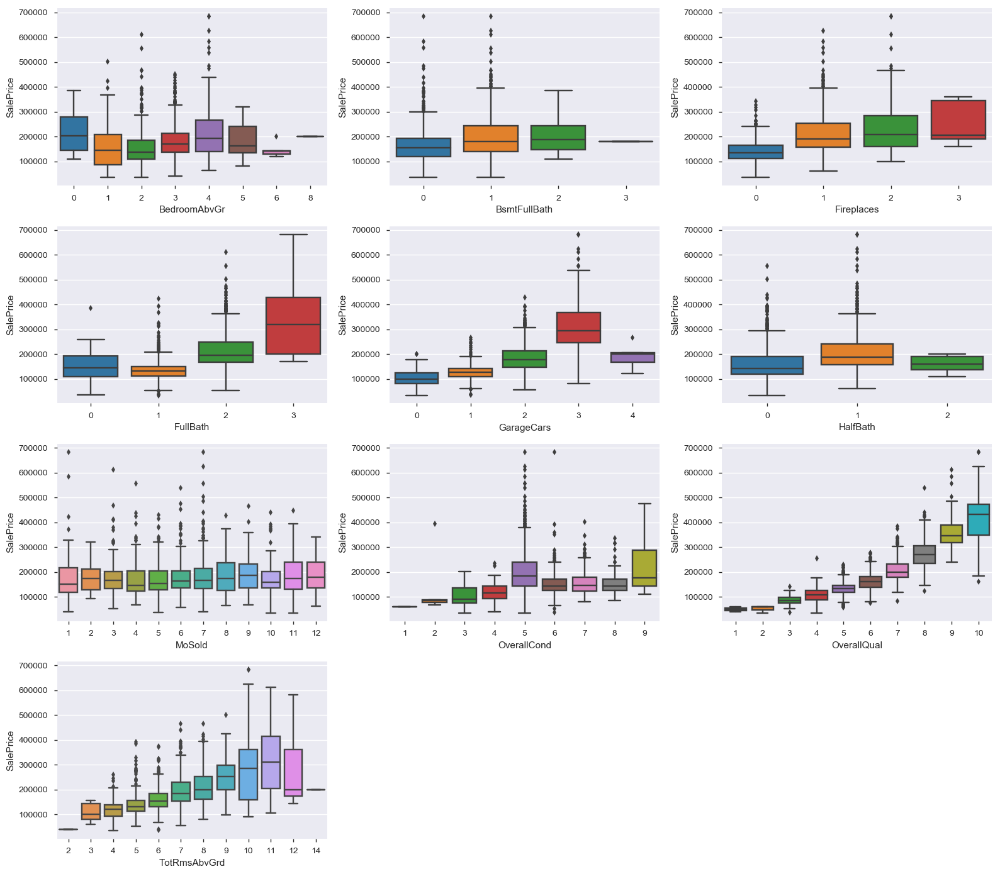

In [57]:
# Plotting
rows = math.ceil(len(ordered_categorical_features) / 3)
plt.figure(figsize=(16,14))
for i in range(0,len(ordered_categorical_features)):
    plt.subplot(rows, 3, i+1)
    sns.boxplot(x=ordered_categorical_features[i],y='SalePrice',data=df)
plt.tight_layout()
plt.show()

 Data Interpretation for Ordered Categorical Independent Variables with Dependent Variable  
- BedroomAbvGr - Sale Price seems consistent across
- BsmtFullBath - Sale Price increase with increase in value. But not much.
- FirePlaces - Sale Price increases from 0 to 2
- FullBath - Sale Price increases from 1 to 3
- GarageCars - Sale Price increases from 0 to 3
- HalfBath - Increase in half bath not impacting the Sale Price much
- MSSubClass - Highest price for 60 (2-STORY 1946 & NEWER). And Lowest for 30 (1-STORY 1945 & OLDER)
- Higher OverallQual (1 to 10) increases the Sale Price. Clear visualization to depict this trend.
- Higher OverallCond (1 to 10) increases the Sale Price
- Higher TotRmsAbvGrd (2 to 11) increases the Sale Price
- MoSold (1 to 12) does not seem to have much impact on Sale Price
<br/><br/>
- Positive and high correlation of SalePrice with GarageCars, TotRmsAbvGrd, OverallQual, Fireplaces, FullPath
- Positive correlation of SalesPrice with BedroomAbvGr, BsmtFullBath, HalfBath but not high
- Negative correlation of SalesPrice with MSSubClass, OverallCond but not high

##### Visualizing Categorical Features (Independent Variables) with SalePrice (Dependent Variable)

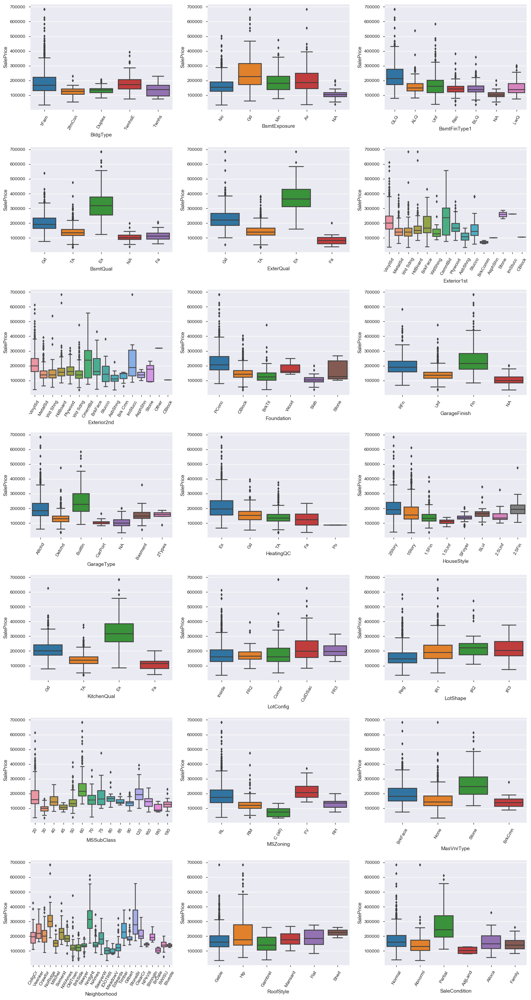

In [58]:
# Plotting
rows = math.ceil(len(categorical_features) / 3)
plt.figure(figsize=(16,30))
for i in range(0,len(categorical_features)):
    plt.subplot(rows, 3, i+1)
    sns.boxplot(x=categorical_features[i],y='SalePrice',data=df)
    plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

 Data Interpretation for Categorical Independent Variables with Dependent Variable  
- **_BldgType_** 
	- 1Fam seems to have outliers and higher Sale Price entries
	- Largely price seems consistent


- **_BsmtExposure_** (Refers to walkout or garden level walls)
	- Gd (Good Exposure) has higher Sale Price. Beyond 200000.
	- NA (No Basement) has lower Sale Price. Around 100000.
    - It is an Ordered Categorical Variable


- **_BsmtFinType1_** (Rating of basement finished area)
	- GLQ (Good Living Quarters) has higher Sale Price. Beyond 200000.
	- NA (No Basement) has lower Sale Price. Around 100000.


- **_BsmtQual_** (Evaluates the height of the basement)
	- Ex (Excellent (100+ inches)) has a clearly higher Sale Price. Beyond 300000.
	- NA (No Basement) has lower Sale Price. Around 100000.
    - It is an Ordered Categorical Variable


- **_ExterQual_** (Evaluates the quality of the material on the exterior)
	- Ex (Excellent) has Sale Price close to 400000
	- Fa (Fair) has Sale Price close to 100000
	- It is an Ordered Categorical Variable


- **_Exterior1st_** (Exterior covering on house)
	- CemntDb (Cement Board) typically has high Sale Price. Beyond 250000
	- BrkComm(Brick Common) seems to have lower Sale Price. Under 100000


- **_Exterior2nd_** (Exterior covering on house (if more than one material))
	- CemntDb (Cement Board) typically has high Sale Price. Beyond 250000


- **_Foundation_**
	- PConc (Poured Contrete) has Sale Price typically beyond 200000.
	- Slab has Sale Price around 100000.


- **_GarageFinish_** (Interior finish of the garage)
	- Fin (Finished) and RFn (Roughly Finished) has higher Sale Price. Beyond 200000
	- NA (No Garage) has Sale Price around 100000.


- **_GarageType_** (Garage location)
	- BulitIn has price beyond 200000
	- CarPort and NA (No Garage) has price hovering around 100000


- **_HeathQC_** (Heating quality and condition)
	- Ex (Excellent) fetches Sale Price around 200000
	- Po (Poor) fetches Sale Price around 100000


- **_HouseStyle_** (Style of dwelling)
	- 2Story (Two story) and 2.5Fin (Two and one-half story: 2nd level finished) seems to have higher Sale Price
	- 1.5Unf (One and one-half story: 2nd level unfinished) seems to have lowest Sale Price


- **_KitchenQual_**
	- Ex (Excellent) has Sale Price beyond 300000
	- Fa (Fair) has Sale Price around 100000
	- It is an Ordered Categorical Variable


- **_LotConfig_**
	- Sale Price almost same across categories.


- **_LotShape_**
	- Sale Price lowest for Reg (Regular)
	- Price almost consistent for all other categories.


- **_MSZoning_**
	- Sale Price highest with RL (Residential Low Density) and FV(Floating Village Residential).
	- Sale Price lowest with C(all) ==> Commerical


- **_MasVnrType**_
	- Sale Price highest for Stone. Beyond 200000.


- **_Neighborhood_** (Physical locations within Ames city limits)
	- StoneBr (Stone Brook), NridgHt (Northridge Heights), NoRidge (Northridge) are the neighbourhoods having highest Sale Price. Above 250000
	- IDOTRR (Iowa DOT and Rail Road), BrDale (Briardale), OldTown, BrkSide (Brookside), MeadowV (Meadow Village) neighbourhoods have the lowest Sale Price. Around 100000


- **_RoofStyle_** 
	- Shed seems to have higher Sale Price. Beyond 200000.


- **_SaleCondition_**
	- Partial seems to hvae higher Sale Price. Beyond 200000.

##### Deriving New Boolean Features & Analysis with Dependent Variable

In [59]:
# Has Second Floor
df['Has2ndFlr'] = df['2ndFlrSF'] > 0
df.loc[df['Has2ndFlr'], ['Has2ndFlr']] = 1
df.loc[df['Has2ndFlr'] != True, ['Has2ndFlr']] = 0
df[['Has2ndFlr','2ndFlrSF']].head()

,Has2ndFlr,2ndFlrSF
0,1,854
1,0,0
2,1,866
3,1,756
4,1,1053


In [60]:
# Has Basement
df['HasBsmt'] = df['BsmtExposure'] != 'NA'
df.loc[df['HasBsmt'], ['HasBsmt']] = 1
df.loc[df['HasBsmt'] != True, ['HasBsmt']] = 0
df[['HasBsmt','BsmtExposure']].head()

,HasBsmt,BsmtExposure
0,1,No
1,1,Gd
2,1,Mn
3,1,No
4,1,Av


In [61]:
# Has Garage
df['HasGarage'] = df['GarageType'] != 'NA'
df.loc[df['HasGarage'], ['HasGarage']] = 1
df.loc[df['HasGarage'] != True, ['HasGarage']] = 0
df[['HasGarage','GarageType']].head()

,HasGarage,GarageType
0,1,Attchd
1,1,Attchd
2,1,Attchd
3,1,Detchd
4,1,Attchd


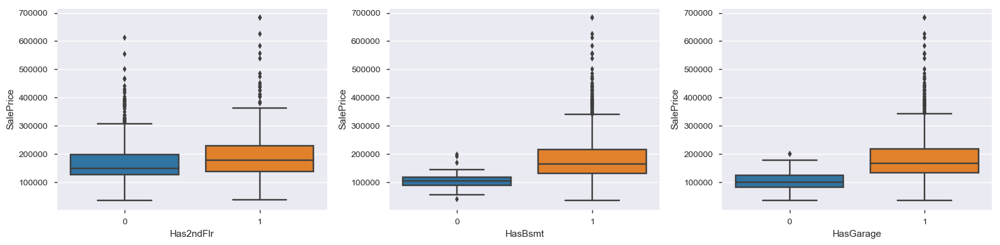

In [62]:
# Plotting box plots
plt.figure(figsize=(16,4))
plt.subplot(131)
sns.boxplot(x='Has2ndFlr',y='SalePrice',data=df)
plt.subplot(132)
sns.boxplot(x='HasBsmt',y='SalePrice',data=df)
plt.subplot(133)
sns.boxplot(x='HasGarage',y='SalePrice',data=df)
plt.tight_layout()
plt.show()

 Derived Boolean Feature Analysis with Sale Price 
- Has2ndFlr boolean True or False does not seem to have an huge impact on the Sale Price.
- HasBsmt True value increases the Sale Price of the property.
- HasGarage True value increase the Sale Price of the property.

<a id="NFA"></a>
### 2.8 Numerical Feature Analysis

<a id="NFUA"></a>
#### 2.8.1 Numerical Features - Univariate Analysis

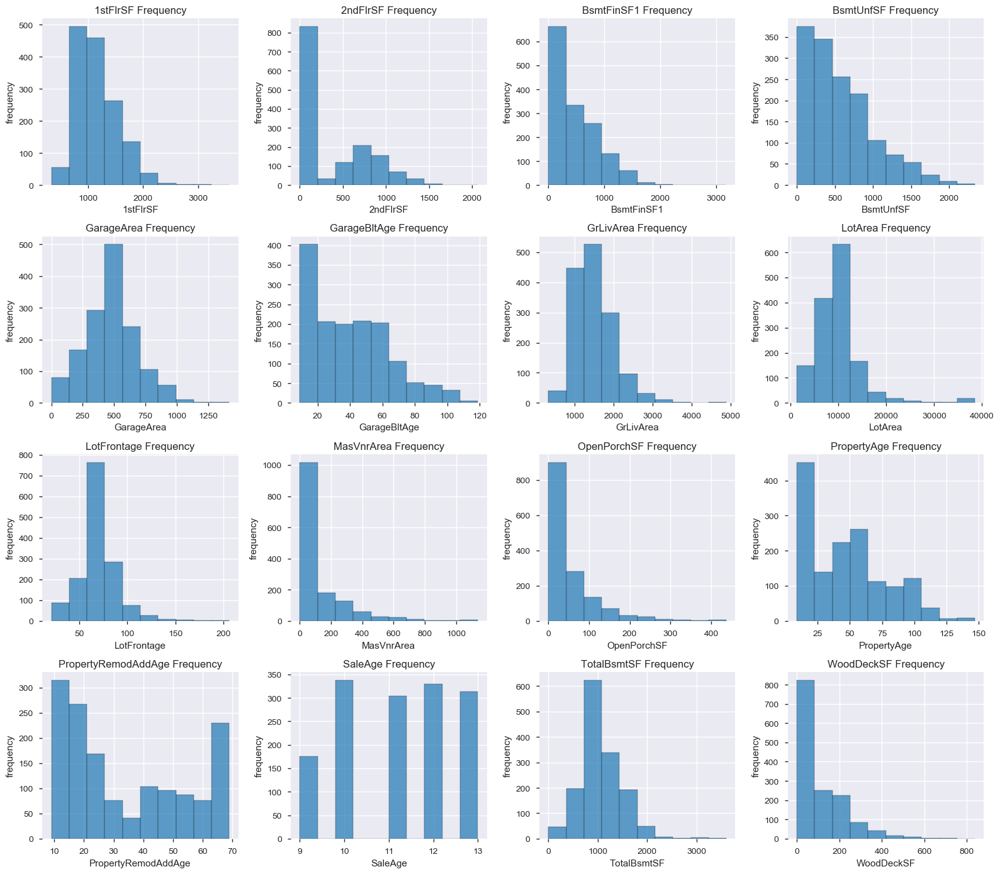

In [63]:
# Plotting
rows = math.ceil(len(numerical_features) / 4)
plt.figure(figsize=(16,14))
for i in range(0,len(numerical_features)):
    plt.subplot(rows, 4, i+1)
    plt.hist(df[numerical_features[i]],alpha=0.7, ec='black')
    plt.xlabel(numerical_features[i])
    plt.ylabel('frequency')
    plt.title(numerical_features[i] + ' Frequency')
plt.tight_layout()
plt.show()

 Data Interpretation for Univariate Analysis of Numerical Features 
- **_PropertyRemodAddAge_** ==> 10 to 20 years of recent modifications of properties has the highest frequency.
- **_PropertyAge_** ==> Typically properties are under 20 years old
- **_2ndFlrSF_** ==> Value of 0, suggesting no second floor has highest frequency. Typically if 2nd Floor exists then the value ranges between 500 to 1000. Maybe a feature can be drived like "**Has2ndFlr**"
- **_MasVnrArea_** ==> Value of 0, suggesting no masonry area has highest frequency. Typically if Masonry Area exists then the value ranges between 100 to 400.
- **_GarageArea_** ==> Seems normally distributed with values mostly ranging between 400 to 800
- **_BsmtUnfSF_** ==> Frequency steadily decreasing with values
- **_GrLivArea_** ==> Values range between 1000 to 2000
- **_WoodDeckSF_** ==> Value of 0, suggesting no Wood Deck has highest frequency. Typically if WoodDeck exists then the value ranges between 100 to 200.
- **_LotArea_** => Values ranging mostly between 500 to 15000 with highest frequency at 10000
- **_GarageBltAge_** ==> Between 20 to 60 years is the typical frequency.
- **_BsmtFinSF1_** ==> Frequency steadily decreasing with values
- **_TotalBsmtSF_** ==> Seems normally distributed with values mostly ranging between 500 to 15000
- **_LotFrontage_** ==> Ranges between 50 to 100 with highest frequency around 75
- **_OpenPorchSF_** ==> Value of 0, suggesting no OpenPorch. Also, value decreasing.
- **_SaleAge_** ==> Consistent frequency across records. Ranging between 9 to 13

<a id="CA"></a>
#### 2.8.2 Correlation Analysis - Bivariate Analysis
Correlation of Independent Variables (x)

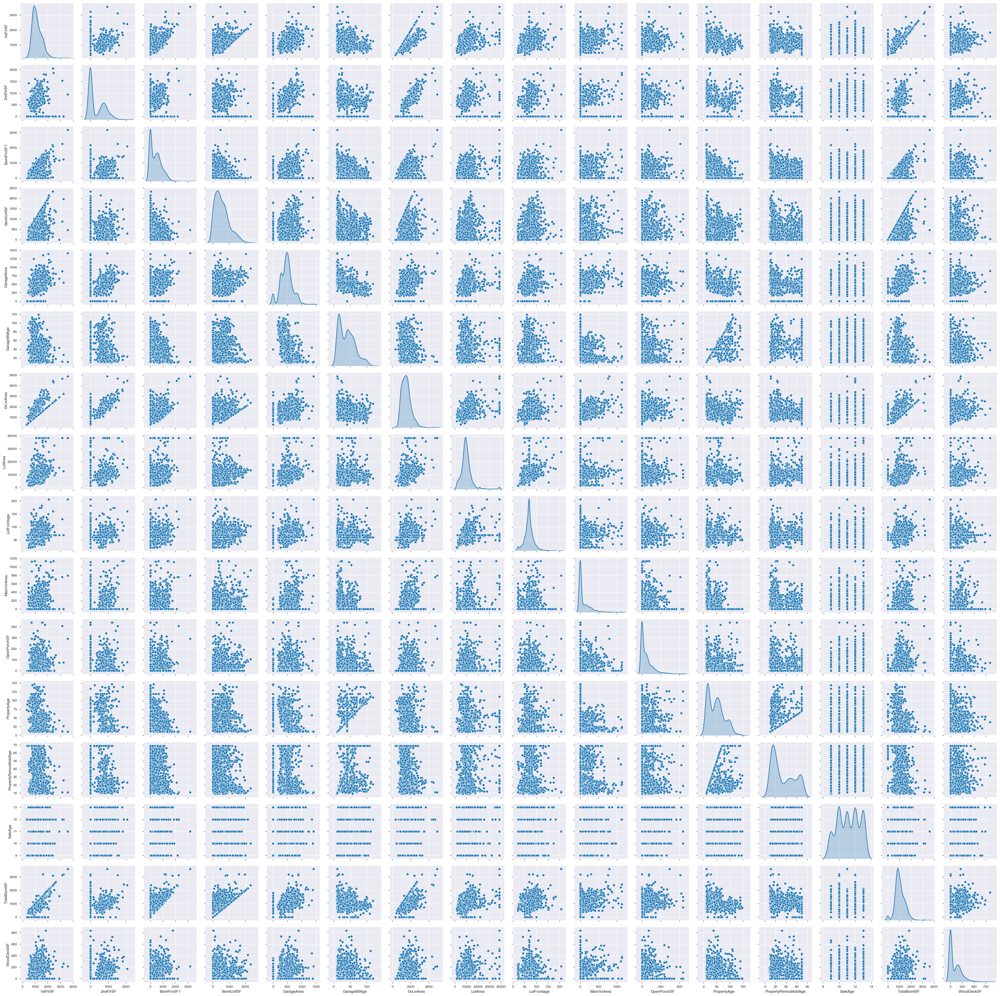

In [64]:
# Plotting pair plot to view correlation for numerical features
sns.pairplot(df[numerical_features], diag_kind = "kde")
plt.show()

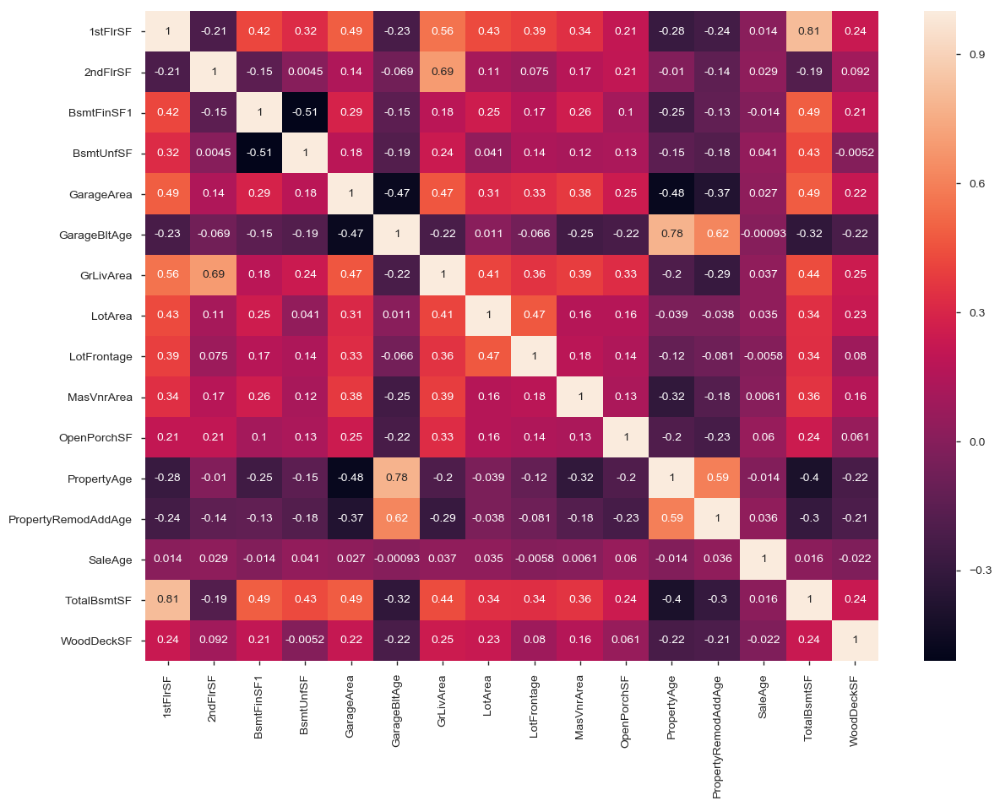

In [65]:
#plotting a heat map to view correlation
plt.figure(figsize=(14,10))
sns.heatmap(df[numerical_features].corr(),annot=True)
plt.show()

In [66]:
def topcorr(df,cols):
    df_corr = pd.DataFrame(round(df[cols].corr()*100).unstack().reset_index())
    df_corr.rename(columns={'level_0':'Feature_1','level_1':'Feature_2',0:'Correlation'}, inplace=True)
    df_corr = df_corr[df_corr['Feature_1'] != df_corr['Feature_2']]
    df_corr = df_corr[df_corr['Feature_1'] != 'price']
    df_corr = df_corr[df_corr['Feature_2'] != 'price']
    df_corr.drop_duplicates(subset='Correlation', inplace=True)
    print("TOP 10 HIGH POSITIVE CORRELATION %","\n")
    print(df_corr.sort_values(by='Correlation',ascending=False).head(10))
    print("\nTOP 10 HIGH NEGATIVE CORRELATION %","\n")
    print(df_corr.sort_values(by='Correlation',ascending=True).head(10))

topcorr(df,numerical_features)

TOP 10 HIGH POSITIVE CORRELATION % 

        Feature_1            Feature_2  Correlation
14       1stFlrSF          TotalBsmtSF         81.0
91   GarageBltAge          PropertyAge         78.0
22       2ndFlrSF            GrLivArea         69.0
92   GarageBltAge  PropertyRemodAddAge         62.0
188   PropertyAge  PropertyRemodAddAge         59.0
6        1stFlrSF            GrLivArea         56.0
4        1stFlrSF           GarageArea         49.0
70     GarageArea            GrLivArea         47.0
110     GrLivArea          TotalBsmtSF         44.0
7        1stFlrSF              LotArea         43.0

TOP 10 HIGH NEGATIVE CORRELATION % 

               Feature_1            Feature_2  Correlation
35            BsmtFinSF1            BsmtUnfSF        -51.0
75            GarageArea          PropertyAge        -48.0
69            GarageArea         GarageBltAge        -47.0
190          PropertyAge          TotalBsmtSF        -40.0
76            GarageArea  PropertyRemodAddAge        -37.0

 Data Interpretation for Correlation Analysis 
 - High correlation features are:
    - 1stFlrSF and TotalBsmtSF
    - PropertyAge and GarageBltAge
    - 2ndFlrSF and GrLivArea
    - PropertyRemodAddAge and GarageBltAge
    - PropertyAge and PropertyRemodAddAge
    - 1stFlrSF and GrLivArea
    - BsmtFinSF1 and BsmtUnfSF

<a id="CFA"></a>
### 2.9 Categorical Feature Analysis

<a id="CFUA"></a>
#### 2.9.1 Categorical Features - Univariate Analysis

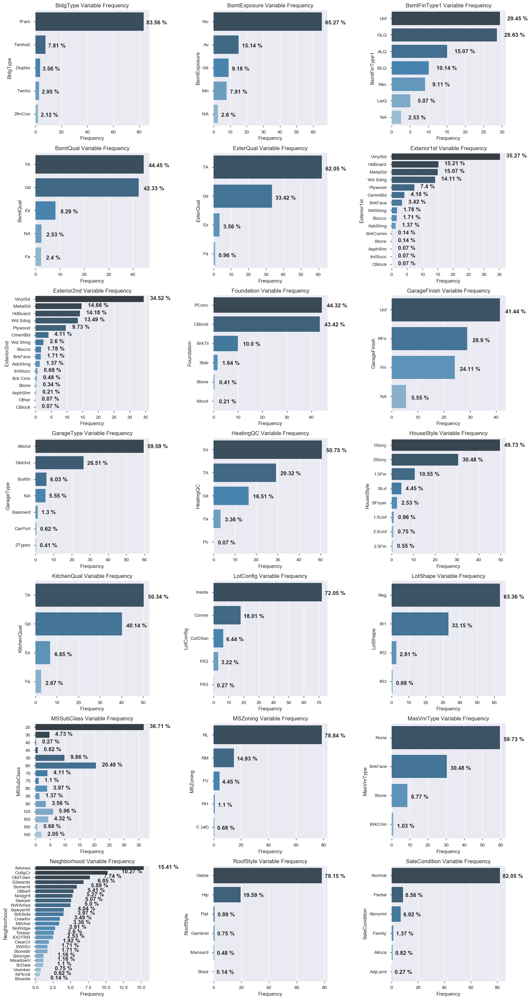

In [67]:
# Plotting
rows = math.ceil(len(categorical_features) / 3)
plt.figure(figsize=(16,30))
for i in range(0,len(categorical_features)):
    plt.subplot(rows, 3, i+1)
    ser = np.round((df[categorical_features[i]].value_counts()/len(df[categorical_features[i]]))*100,2)
    ax = sns.barplot(x=ser.values, y=ser.index, orient="h", palette=("Blues_d"))
    ax.title.set_text(categorical_features[i] + " Variable Frequency")
    ax.set(ylabel=categorical_features[i])
    ax.set(xlabel='Frequency')
    ax.grid(True, axis="x")
    for i in ax.patches:
        ax.text(i.get_width()+2, i.get_y()+.52, str(i.get_width()) + ' %',fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

 Categorical Variables Univarite Analysis 
- All features having a value occurence of 85% were removed, thereby giving better frequency distribution.

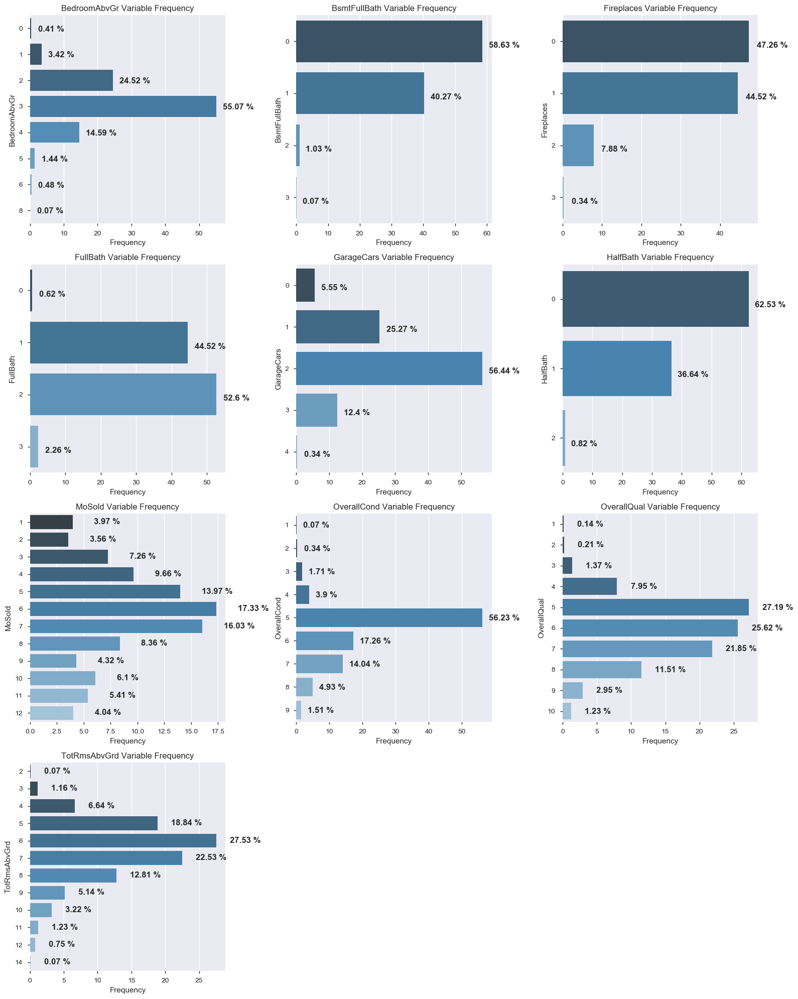

In [68]:
# Plotting
rows = math.ceil(len(ordered_categorical_features) / 3)
plt.figure(figsize=(16,20))
for i in range(0,len(ordered_categorical_features)):
    plt.subplot(rows, 3, i+1)
    ser = np.round((df[ordered_categorical_features[i]].value_counts()/len(df[ordered_categorical_features[i]]))*100,2)
    ax = sns.barplot(x=ser.values, y=ser.index, orient="h", palette=("Blues_d"))
    ax.title.set_text(ordered_categorical_features[i] + " Variable Frequency")
    ax.set(ylabel=ordered_categorical_features[i])
    ax.set(xlabel='Frequency')
    ax.grid(True, axis="x")
    for i in ax.patches:
        ax.text(i.get_width()+2, i.get_y()+.52, str(i.get_width()) + ' %',fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

 Data Interpretation Ordered Categorical Variables Univarite Analysis 
- All features having a value occurence of 85% were removed, thereby giving better frequency distribution.

<a id="FEDP"></a>
# 3. Feature Engineering - Data Preparation

In [69]:
# Getting a copy of dataframe for better organization. Acts as a checkpoint for the dataframe
df_prep = df.copy()

<a id="LE"></a>
### 3.1 Label Encoding - Ordered Categorical Variables

In [70]:
df_prep['BsmtExposure'] = df_prep['BsmtExposure'].map({'NA':0, 'No':1, 'Mn':2, 'Av':3, 'Gd':4})
df_prep['BsmtQual'] = df_prep['BsmtQual'].map({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})
df_prep['KitchenQual'] = df_prep['KitchenQual'].map({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})
df_prep['ExterQual'] = df_prep['ExterQual'].map({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})
df_prep['HeatingQC'] = df_prep['HeatingQC'].map({'NA':0, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})

categorical_features.remove('BsmtExposure')
categorical_features.remove('BsmtQual')
categorical_features.remove('KitchenQual')
categorical_features.remove('ExterQual')
categorical_features.remove('HeatingQC')

ordered_categorical_features.append('BsmtExposure')
ordered_categorical_features.append('BsmtQual')
ordered_categorical_features.append('KitchenQual')
ordered_categorical_features.append('ExterQual')
ordered_categorical_features.append('HeatingQC')
df_prep.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SaleCondition,SalePrice,GarageBltAge,PropertyAge,PropertyRemodAddAge,SaleAge,Has2ndFlr,HasBsmt,HasGarage
0,1,60,RL,65.0,8450.0,Reg,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,4,PConc,4,1,GLQ,706,150,856.0,5,856.0,854,1710.0,1,2,1,3,4,8,0,Attchd,RFn,2,548,0.0,61.0,2,Normal,208500.0,16,16,16,11,1,1,1
1,2,20,RL,80.0,9600.0,Reg,FR2,Veenker,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,3,CBlock,4,4,ALQ,978,284,1262.0,5,1262.0,0,1262.0,0,2,0,3,3,6,1,Attchd,RFn,2,460,298.0,0.0,5,Normal,181500.0,43,43,43,12,0,1,1
2,3,60,RL,68.0,11250.0,IR1,Inside,CollgCr,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,4,PConc,4,2,GLQ,486,434,920.0,5,920.0,866,1786.0,1,2,1,3,4,6,1,Attchd,RFn,2,608,0.0,42.0,9,Normal,223500.0,18,18,17,11,1,1,1
3,4,70,RL,60.0,9550.0,IR1,Corner,Crawfor,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,3,BrkTil,3,1,ALQ,216,540,756.0,4,961.0,756,1717.0,1,1,0,3,4,7,1,Detchd,Unf,3,642,0.0,35.0,2,Abnorml,140000.0,21,104,49,13,1,1,1
4,5,60,RL,84.0,14260.0,IR1,FR2,NoRidge,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,4,PConc,4,3,GLQ,655,490,1145.0,5,1145.0,1053,2198.0,1,2,1,4,4,9,1,Attchd,RFn,3,836,192.0,84.0,12,Normal,250000.0,19,19,19,11,1,1,1


In [71]:
print(ordered_categorical_features)

['BedroomAbvGr', 'BsmtFullBath', 'Fireplaces', 'FullBath', 'GarageCars', 'HalfBath', 'MoSold', 'OverallCond', 'OverallQual', 'TotRmsAbvGrd', 'BsmtExposure', 'BsmtQual', 'KitchenQual', 'ExterQual', 'HeatingQC']


<a id="DC"></a>
### 3.2 Dummy Encoding - Creating dummy variables for the Categorical Columns

In [72]:
# Create dummy columns for categorical variables. Create dummy dataframe, remove 1st column and concat with original df
for i in categorical_features:
    dummy_df = pd.get_dummies(df_prep[i], prefix=i, drop_first=True)
    df_prep = pd.concat([df_prep, dummy_df], axis=1)
    df_prep.drop(i,axis=1,inplace=True)
    
df_prep.head()

,Id,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,GarageBltAge,PropertyAge,PropertyRemodAddAge,SaleAge,Has2ndFlr,HasBsmt,HasGarage,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotShape_IR2,LotShape_IR3,LotShape_Reg,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,65.0,8450.0,7,5,196.0,4,4,1,706,150,856.0,5,856.0,854,1710.0,1,2,1,3,4,8,0,2,548,0.0,61.0,2,208500.0,16,16,16,11,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,2,80.0,9600.0,6,8,0.0,3,4,4,978,284,1262.0,5,1262.0,0,1262.0,0,2,0,3,3,6,1,2,460,298.0,0.0,5,181500.0,43,43,43,12,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0
2,3,68.0,11250.0,7,5,162.0,4,4,2,486,434,920.0,5,920.0,866,1786.0,1,2,1,3,4,6,1,2,608,0.0,42.0,9,223500.0,18,18,17,11,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
3,4,60.0,9550.0,7,5,0.0,3,3,1,216,540,756.0,4,961.0,756,1717.0,1,1,0,3,4,7,1,3,642,0.0,35.0,2,140000.0,21,104,49,13,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,

In [73]:
df_prep.shape

(1460, 158)

In [74]:
# Printing the correlation with Price
print(round(df_prep.corr()['SalePrice']*100))

Id                        -2.0
LotFrontage               35.0
LotArea                   39.0
OverallQual               79.0
OverallCond               -8.0
MasVnrArea                47.0
ExterQual                 69.0
BsmtQual                  59.0
BsmtExposure              38.0
BsmtFinSF1                40.0
BsmtUnfSF                 22.0
TotalBsmtSF               64.0
HeatingQC                 43.0
1stFlrSF                  62.0
2ndFlrSF                  32.0
GrLivArea                 71.0
BsmtFullBath              23.0
FullBath                  56.0
HalfBath                  28.0
BedroomAbvGr              17.0
KitchenQual               66.0
TotRmsAbvGrd              54.0
Fireplaces                47.0
GarageCars                64.0
GarageArea                63.0
WoodDeckSF                33.0
OpenPorchSF               32.0
MoSold                     5.0
SalePrice                100.0
GarageBltAge             -47.0
                         ...  
Neighborhood_CollgCr       7.0
Neighbor

In [75]:
topcorr(df_prep,list(df_prep.columns))

TOP 10 HIGH POSITIVE CORRELATION % 

                 Feature_1            Feature_2  Correlation
5958       BldgType_Duplex        MSSubClass_90        100.0
5804       BldgType_2fmCon       MSSubClass_190         98.0
7964   Exterior1st_CemntBd  Exterior2nd_CmentBd         97.0
15120      HouseStyle_SLvl        MSSubClass_80         94.0
14167    HouseStyle_1.5Unf        MSSubClass_45         93.0
2245              2ndFlrSF            Has2ndFlr         91.0
3658            GarageCars           GarageArea         88.0
9237   Exterior1st_Wd Sdng  Exterior2nd_Wd Sdng         86.0
2391             GrLivArea         TotRmsAbvGrd         83.0
1751           TotalBsmtSF             1stFlrSF         81.0

TOP 10 HIGH NEGATIVE CORRELATION % 

               Feature_1          Feature_2  Correlation
5610           HasGarage    GarageFinish_NA       -100.0
5415             HasBsmt    BsmtFinType1_NA        -99.0
23534    RoofStyle_Gable      RoofStyle_Hip        -93.0
5304           Has2ndFlr  

In [76]:
#Dropping few redundant features based on exteremly high correlation of 90% plus.
df_prep.drop(['GarageFinish_NA','BsmtFinType1_NA', 'Exterior2nd_CBlock', 'Exterior2nd_CmentBd','MSSubClass_90',
              'MSSubClass_190','MSSubClass_80','MSSubClass_45','RoofStyle_Hip','2ndFlrSF'],axis=1, inplace=True)
numerical_features.remove('2ndFlrSF')

In [77]:
df_prep.shape

(1460, 148)

<a id="split"></a>
# 4. Split Data into Training and Test Sets 

In [78]:
np.random.seed(0)
df_train, df_test = train_test_split(df_prep, train_size = 0.7, random_state = 100)
print("Train Shape:", df_train.shape, "Test Shape:", df_test.shape)

Train Shape: (1021, 148) Test Shape: (439, 148)


In [79]:
# Putting feature variable to X
X = df_prep.drop(['SalePrice'], axis=1)
X.set_index('Id', inplace=True)
X.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,GarageBltAge,PropertyAge,PropertyRemodAddAge,SaleAge,Has2ndFlr,HasBsmt,HasGarage,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageFinish_RFn,GarageFinish_Unf,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotShape_IR2,LotShape_IR3,LotShape_Reg,MSSubClass_30,MSSubClass_40,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_85,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450.0,7,5,196.0,4,4,1,706,150,856.0,5,856.0,1710.0,1,2,1,3,4,8,0,2,548,0.0,61.0,2,16,16,16,11,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,80.0,9600.0,6,8,0.0,3,4,4,978,284,1262.0,5,1262.0,1262.0,0,2,0,3,3,6,1,2,460,298.0,0.0,5,43,43,43,12,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0
3,68.0,11250.0,7,5,162.0,4,4,2,486,434,920.0,5,920.0,1786.0,1,2,1,3,4,6,1,2,608,0.0,42.0,9,18,18,17,11,1,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
4,60.0,9550.0,7,5,0.0,3,3,1,216,540,756.0,4,961.0,1717.0,1,1,0,3,4,7,1,3,642,0.0,35.0,2,21,104,49,13,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
5,84.0,14260.0,8,5,350.0,4,4,3,655,490,1145.0,5,1145.0,2198.0,1,2,1,4,4,9,1,3,836,192.0,84.0,12,19,19,19,11,1

In [80]:
# Putting response variable to y
y = df_prep[['SalePrice','Id']]
y.set_index('Id', inplace=True)
y = y['SalePrice']
y.head()

Id
1    208500.0
2    181500.0
3    223500.0
4    140000.0
5    250000.0
Name: SalePrice, dtype: float64

<a id="train"></a>
# 5. Training the Model

<a id="MMS"></a>
### 5.1 MinMax Scaling

Applying Scaler only numerical features.

In [81]:
scaled_features = numerical_features + ordered_categorical_features

In [82]:
scaler = MinMaxScaler()
df_train[scaled_features] = scaler.fit_transform(df_train[scaled_features])
df_train.describe([0.25,0.50,0.75,0.95,0.99])

,Id,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,BsmtQual,BsmtExposure,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,GarageBltAge,PropertyAge,PropertyRemodAddAge,SaleAge,Has2ndFlr,HasBsmt,HasGarage,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageFinish_RFn,GarageFinish_Unf,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotShape_IR2,LotShape_IR3,LotShape_Reg,MSSubClass_30,MSSubClass_40,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_85,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Mansard,RoofStyle_Shed,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.0000

In [83]:
y_train = df_train.pop('SalePrice')
X_train = df_train

In [84]:
X_train.shape

(1021, 147)

In [85]:
y_train.shape

(1021,)

In [86]:
y_test = df_test.pop('SalePrice')
X_test = df_test

In [87]:
X_test.shape

(439, 147)

In [88]:
y_test.shape

(439,)

<a id="RFE"></a>
### 5.2 RFE

In [89]:
lm = LinearRegression()
lm.fit(X_train, y_train)
rfe = RFE(lm, 20)
rfe = rfe.fit(X_train, y_train)
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Id', False, 127),
 ('LotFrontage', False, 53),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('MasVnrArea', False, 54),
 ('ExterQual', False, 2),
 ('BsmtQual', True, 1),
 ('BsmtExposure', True, 1),
 ('BsmtFinSF1', True, 1),
 ('BsmtUnfSF', False, 78),
 ('TotalBsmtSF', True, 1),
 ('HeatingQC', False, 99),
 ('1stFlrSF', False, 12),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 11),
 ('FullBath', False, 26),
 ('HalfBath', False, 38),
 ('BedroomAbvGr', False, 18),
 ('KitchenQual', True, 1),
 ('TotRmsAbvGrd', False, 37),
 ('Fireplaces', False, 27),
 ('GarageCars', True, 1),
 ('GarageArea', True, 1),
 ('WoodDeckSF', False, 46),
 ('OpenPorchSF', False, 28),
 ('MoSold', False, 107),
 ('GarageBltAge', False, 112),
 ('PropertyAge', False, 98),
 ('PropertyRemodAddAge', False, 80),
 ('SaleAge', False, 102),
 ('Has2ndFlr', False, 105),
 ('HasBsmt', True, 1),
 ('HasGarage', False, 29),
 ('BldgType_2fmCon', False, 9),
 ('BldgType_Duplex', False, 7),
 ('BldgType_T

In [90]:
feature_cols = list(X_train.columns[rfe.support_])
feature_cols

['LotArea',
 'OverallQual',
 'OverallCond',
 'BsmtQual',
 'BsmtExposure',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'GrLivArea',
 'KitchenQual',
 'GarageCars',
 'GarageArea',
 'HasBsmt',
 'Exterior1st_ImStucc',
 'LotShape_IR3',
 'MSSubClass_160',
 'Neighborhood_BrDale',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr']

<a id="STATS"></a>
### 5.3 Building model using statsmodel, for the detailed statistics

In [91]:
# function for listing vif
def vif_list(X_train):
    vif = pd.DataFrame()
    vif['features'] = X_train.columns
    vif['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
    vif = vif.sort_values(by='VIF', ascending=False)
    print(vif)

# function for listing model
def model(features):
    X_train_rfe = X_train[features]
    X_train_rfe = sm.add_constant(X_train_rfe)
    lm = sm.OLS(y_train, X_train_rfe).fit()
    print(lm.summary())
    vif_list(X_train[features])
    return lm

**Model #1**

In [92]:
lm_1 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.849
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     280.5
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:04   Log-Likelihood:                -11988.
No. Observations:                1021   AIC:                         2.402e+04
Df Residuals:                    1000   BIC:                         2.412e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -3.274e+04 

Checking Three conditions
- High p-value, high VIF
- High-low:
    - High p, low VIF ==> Remove these first
    - Low p, high VIF ==> Remove these after
- Low p, Low VIF

First remove high p-value cols and recompute VIF. As it is possible VIF decreases with this variable being removed.

**Model #2**<br/>
Exterior1st_ImStucc has high p-value, removing it and remodelling

In [93]:
feature_cols.remove('Exterior1st_ImStucc')
lm_2 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.848
Model:                            OLS   Adj. R-squared:                  0.846
Method:                 Least Squares   F-statistic:                     294.9
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:04   Log-Likelihood:                -11989.
No. Observations:                1021   AIC:                         2.402e+04
Df Residuals:                    1001   BIC:                         2.412e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -3.272e+04 

**Model #3**<br/>
HasBsmt has high VIF, removing it and remodelling

In [94]:
feature_cols.remove('HasBsmt')
lm_3 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     296.5
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:05   Log-Likelihood:                -12010.
No. Observations:                1021   AIC:                         2.406e+04
Df Residuals:                    1002   BIC:                         2.415e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -5.711e+04 

**Model #4**<br/>
Neighborhood_BrDale has high p value, removing it and remodelling

In [95]:
feature_cols.remove('Neighborhood_BrDale')
lm_4 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.841
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     313.1
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:05   Log-Likelihood:                -12012.
No. Observations:                1021   AIC:                         2.406e+04
Df Residuals:                    1003   BIC:                         2.415e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -5.679e+04 

**Model #5**<br/>
OverallQual has high VIF, removing it and remodelling

In [96]:
feature_cols.remove('OverallQual')
lm_5 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.822
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     289.9
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:05   Log-Likelihood:                -12071.
No. Observations:                1021   AIC:                         2.418e+04
Df Residuals:                    1004   BIC:                         2.426e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -4.112e+04 

**Model #6**<br/>
GarageCars has high VIF, removing it and remodelling

In [97]:
feature_cols.remove('GarageCars')
lm_6 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.815
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     295.2
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:05   Log-Likelihood:                -12091.
No. Observations:                1021   AIC:                         2.421e+04
Df Residuals:                    1005   BIC:                         2.429e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -3.506e+04 

**Model #7**<br/>
BsmtQual has high VIF, removing it and remodelling

In [98]:
feature_cols.remove('BsmtQual')
lm_7 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.805
Method:                 Least Squares   F-statistic:                     301.1
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:05   Log-Likelihood:                -12111.
No. Observations:                1021   AIC:                         2.425e+04
Df Residuals:                    1006   BIC:                         2.433e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 -1.33e+04 

**Model #8**<br/>
TotalBsmtSF has high p-value, removing it and remodelling

In [99]:
feature_cols.remove('TotalBsmtSF')
lm_8 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.797
Method:                 Least Squares   F-statistic:                     308.8
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:06   Log-Likelihood:                -12132.
No. Observations:                1021   AIC:                         2.429e+04
Df Residuals:                    1007   BIC:                         2.436e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1053.7908 

**Model #9**<br/>
LotShape_IR3 has high p-value, removing it and remodelling

In [100]:
feature_cols.remove('LotShape_IR3')
lm_9 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.799
Model:                            OLS   Adj. R-squared:                  0.796
Method:                 Least Squares   F-statistic:                     333.3
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:06   Log-Likelihood:                -12134.
No. Observations:                1021   AIC:                         2.429e+04
Df Residuals:                    1008   BIC:                         2.436e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 -977.0602 

**Model #10**<br/>
KitchedQual has high VIF, removing it and remodelling

In [101]:
feature_cols.remove('KitchenQual')
lm_10 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.763
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     295.3
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          3.12e-306
Time:                        22:19:06   Log-Likelihood:                -12217.
No. Observations:                1021   AIC:                         2.446e+04
Df Residuals:                    1009   BIC:                         2.452e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.351e+04 

**Model #11**<br/>
LotArea has high p-value, removing it and remodelling

In [102]:
feature_cols.remove('LotArea')
lm_11 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.762
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     323.8
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          8.48e-307
Time:                        22:19:06   Log-Likelihood:                -12219.
No. Observations:                1021   AIC:                         2.446e+04
Df Residuals:                    1010   BIC:                         2.451e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 1.509e+04 

**Model #12**<br/>
GarageArea has high VIF, removing it and remodelling

In [103]:
feature_cols.remove('GarageArea')
lm_12 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.741
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                     321.9
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          1.27e-289
Time:                        22:19:07   Log-Likelihood:                -12262.
No. Observations:                1021   AIC:                         2.454e+04
Df Residuals:                    1011   BIC:                         2.459e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 3.245e+04 

**Model #13**<br/>
- The R-square value has dropped.
- Addding OverallQual and remodelling

In [104]:
feature_cols.append('OverallQual')
lm_13 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     431.8
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:07   Log-Likelihood:                -12103.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                    1010   BIC:                         2.428e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -3.082e+04 

**Model #14**<br/>
- Removing OverallCond and Remodelling

In [105]:
feature_cols.remove('OverallCond')
lm_14 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.808
Method:                 Least Squares   F-statistic:                     476.7
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:07   Log-Likelihood:                -12106.
No. Observations:                1021   AIC:                         2.423e+04
Df Residuals:                    1011   BIC:                         2.428e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.908e+04 

**Model #15**<br/>
- Removing BsmtExposure and remodelling

In [106]:
feature_cols.remove('BsmtExposure')
lm_15 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     492.2
Date:                Mon, 23 Sep 2019   Prob (F-statistic):               0.00
Time:                        22:19:07   Log-Likelihood:                -12142.
No. Observations:                1021   AIC:                         2.430e+04
Df Residuals:                    1012   BIC:                         2.435e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.622e+04 

**Model #16**<br/>
- Removing GrLivArea and remodelling

In [107]:
feature_cols.remove('GrLivArea')
lm_16 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.728
Method:                 Least Squares   F-statistic:                     390.6
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          1.50e-282
Time:                        22:19:07   Log-Likelihood:                -12284.
No. Observations:                1021   AIC:                         2.458e+04
Df Residuals:                    1013   BIC:                         2.462e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.683e+04 

**Model #17**<br/>
- Removing Neighborhood_StoneBr as it has high p-value and remodelling

In [108]:
feature_cols.remove('Neighborhood_StoneBr')
lm_17 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.729
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     454.4
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          2.60e-283
Time:                        22:19:08   Log-Likelihood:                -12286.
No. Observations:                1021   AIC:                         2.459e+04
Df Residuals:                    1014   BIC:                         2.462e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.863e+04 

**Model #18**<br/>
- Removing Neighborhood_Somerst and remodelling

In [109]:
feature_cols.remove('Neighborhood_Somerst')
lm_18 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.724
Model:                            OLS   Adj. R-squared:                  0.722
Method:                 Least Squares   F-statistic:                     531.9
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          1.52e-280
Time:                        22:19:08   Log-Likelihood:                -12295.
No. Observations:                1021   AIC:                         2.460e+04
Df Residuals:                    1015   BIC:                         2.463e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -2.392e+04 

**Model #19**<br/>
- Removing Neighborhood_NridgHt and remodelling

In [110]:
feature_cols.remove('Neighborhood_NridgHt')
lm_19 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                     618.0
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          2.72e-270
Time:                        22:19:08   Log-Likelihood:                -12322.
No. Observations:                1021   AIC:                         2.465e+04
Df Residuals:                    1016   BIC:                         2.468e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -3.681e+04 

**Model #20**<br/>
- Removing MSSubClass_160 and remodelling

In [111]:
feature_cols.remove('MSSubClass_160')
lm_20 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.696
Method:                 Least Squares   F-statistic:                     781.0
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          2.54e-263
Time:                        22:19:08   Log-Likelihood:                -12342.
No. Observations:                1021   AIC:                         2.469e+04
Df Residuals:                    1017   BIC:                         2.471e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 -3.76e+04 

**Model #21**<br/>
- Removing BsmtFinSF1 and adding LotArea and remodelling

In [112]:
feature_cols.remove('BsmtFinSF1')
feature_cols.append('LotArea')
lm_21 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.708
Method:                 Least Squares   F-statistic:                     825.5
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          6.43e-272
Time:                        22:19:08   Log-Likelihood:                -12322.
No. Observations:                1021   AIC:                         2.465e+04
Df Residuals:                    1017   BIC:                         2.467e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 -5.42e+04 

**Model #22**<br/>
- Adding Neighborhood_NridgHt and remodelling

In [113]:
feature_cols.append('Neighborhood_NridgHt')
lm_22 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.729
Method:                 Least Squares   F-statistic:                     686.9
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          4.57e-287
Time:                        22:19:09   Log-Likelihood:                -12283.
No. Observations:                1021   AIC:                         2.458e+04
Df Residuals:                    1016   BIC:                         2.460e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                 -3.96e+04 

**Model #23**<br/>
- Adding BsmtFinSF1 and remodelling

In [114]:
feature_cols.append('BsmtFinSF1')
lm_23 = model(feature_cols)

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     610.1
Date:                Mon, 23 Sep 2019   Prob (F-statistic):          8.20e-303
Time:                        22:19:09   Log-Likelihood:                -12244.
No. Observations:                1021   AIC:                         2.450e+04
Df Residuals:                    1015   BIC:                         2.453e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -4.063e+04 

 Data Interpretation of Model Training <br/>
The model lm)_23 has features
    - OverallQual
    - LotArea
    - Neighborhood_NoRidge
    - BsmtFinSF1
    - Neighborhood_NridgHt
<br/><br/>
The R2 score is 75%. Baselining this model.

##### Residual Analysis for Model lm_23

In [115]:
X_train_rfe = X_train[feature_cols]
X_train_rfe = sm.add_constant(X_train_rfe)
y_train_pred = lm_23.predict(X_train_rfe)

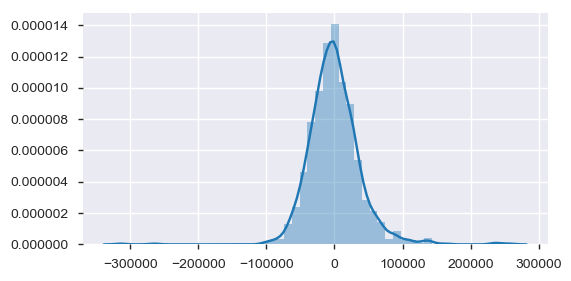

In [116]:
res = y_train - y_train_pred
plt.figure(figsize=(6,3))
sns.distplot(res)
plt.show()

Residuals normally distributed and centered around mean

<a id="Ridge"></a>
## 5.4 Ridge Regression
Taking a range of alphas to check with. Ideally this step is not needed and a value or range of alpha values can be choosen. However, for assignment purpose checking for all these alpha values.

In [117]:
# set up cross validation scheme
folds = KFold(n_splits = 5, shuffle = True, random_state = 4)

# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

ridge = Ridge()

model_ridge_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_ridge_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    2.0s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
       error_score='raise-deprecating',
       estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_absolute_error', verbose=1)

In [118]:
model_ridge_cv.best_params_

{'alpha': 7.0}

In [119]:
cv_ridge_results = pd.DataFrame(model_ridge_cv.cv_results_)
cv_ridge_results = cv_ridge_results[cv_ridge_results['param_alpha']<=75]
cv_ridge_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.118746,0.221978,0.000000,0.000000,0.0001,{'alpha': 0.0001},-20154.358451,-19525.169861,-21508.933438,-19760.487462,-22033.540287,-20596.064854,993.568535,24,-16898.818498,-16029.283958,-16478.857794,-17004.340900,-15440.157179,-16370.291666,578.719633
1,0.003125,0.006249,0.000000,0.000000,0.001,{'alpha': 0.001},-20153.111606,-19519.458610,-21504.913325,-19757.760997,-22026.748797,-20591.968415,992.668273,23,-16897.359443,-16027.927268,-16477.764403,-17002.852871,-15439.991410,-16369.179079,578.299277
2,0.009375,0.007655,0.000000,0.000000,0.01,{'alpha': 0.01},-20140.408396,-19466.078441,-21486.865453,-19731.846083,-21960.932669,-20556.817964,987.550909,22,-16883.883089,-16015.519379,-16467.650455,-16988.854825,-15438.304555,-16358.842461,574.401113
3,0.006250,0.007655,0.003124,0.006249,0.05,{'alpha': 0.05},-20091.194224,-19261.510319,-21422.897362,-19663.100048,-21718.497819,-20431.106707,970.598109,21,-16835.706655,-15978.701992,-16431.411092,-16941.325353,-15438.915737,-16325.212166,558.044614
4,0.009375,0.007655,0.003125,0.006249,0.1,{'alpha': 0.1},-20039.179334,-19076.105264,-21366.869981,-19610.702164,-21527.621768,-20323.816646,967.393512,20,-16804.020771,-15958.047245,-16409.608839,-16910.526573,-15452.500416,-16306.940769,542.907007


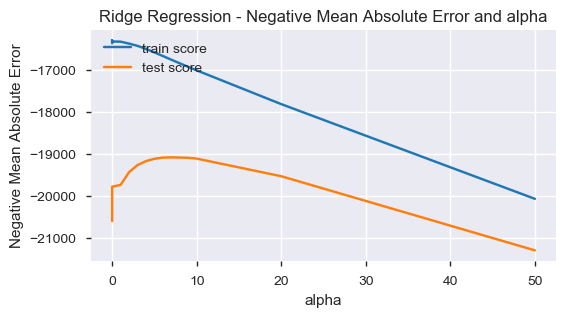

In [120]:
# plotting mean test and train scores with alpha 
cv_ridge_results['param_alpha'] = cv_ridge_results['param_alpha'].astype('int32')

# plotting
plt.figure(figsize=(6,3))

plt.plot(cv_ridge_results['param_alpha'], cv_ridge_results['mean_train_score'])
plt.plot(cv_ridge_results['param_alpha'], cv_ridge_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Ridge Regression - Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

 Data Interpretation of Ridge Regression 
- Larger the Negative Mean Absolute Error the better
- As the value of Alpha (coefficient of the regularization term) increases the emphasis on accuracy of the model reduces and hence model could make more errors.
- The Train score dips with the increasing value of alpha.
- Initially for small values of alpha the test score is good and then reduces.

**The alpha parameter in Scikit-Learn is nothing but theory lambda**<br/>
 **The test curve is peaking around 7 and that is the value of alpha value chosen for Ridge Regression** 

In [121]:
alpha = 5
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

array([-1.58096852e+00,  8.54776437e+03,  1.98143214e+04,  6.69322343e+04,
        2.66422998e+04,  2.25472745e+04,  2.06804028e+04,  2.94731795e+04,
        2.87207796e+04,  2.64073677e+04,  5.31215455e+03,  3.43540732e+04,
        3.32446836e+03,  3.58406493e+04,  5.96713802e+04,  1.47584216e+04,
        2.67598018e+04,  1.55856333e+04, -6.51757674e+02,  2.60954106e+04,
        2.62523901e+04,  1.76461641e+04,  3.01580282e+04,  1.66961257e+04,
        1.14910429e+04, -2.56368996e+03, -7.91699129e+02, -3.01667915e+00,
       -2.58482545e+03, -7.99998224e+03,  3.00510097e+03,  9.17722476e+03,
       -1.88477490e+04, -3.61049166e+03, -1.19022697e+04, -1.51543691e+04,
       -1.31014814e+04, -8.65046536e+03,  1.03442440e+03,  4.93251066e+03,
       -1.84339012e+03, -2.42583825e+03, -4.63713667e+03, -2.80635144e+00,
       -1.66823059e+03,  1.44295519e+04,  1.64949668e+02,  3.30906776e+03,
       -1.87521427e+03, -6.33887295e+03, -1.31990648e+03, -1.18613612e+03,
        9.05976798e+02,  

 Data Interpretation of Ridge Regression 
- The coefficents are dense and close to about zero

<a id="lasso"></a>
## 5.5 Lasso Regression

In [122]:
lasso = Lasso()

model_lasso_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_lasso_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   22.4s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
       error_score='raise-deprecating',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='neg_mean_absolute_error', verbose=1)

In [123]:
model_lasso_cv.best_params_

{'alpha': 100}

In [124]:
cv_lasso_results = pd.DataFrame(model_lasso_cv.cv_results_)
cv_lasso_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.306240,0.136067,0.000000,0.000000,0.0001,{'alpha': 0.0001},-20154.761500,-19525.940320,-21504.370883,-19760.332294,-21997.931883,-20588.242395,982.296651,26,-16898.868839,-16029.394583,-16477.825406,-17004.458072,-15440.134115,-16370.136203,578.710313
1,0.231242,0.018220,0.000000,0.000000,0.001,{'alpha': 0.001},-20154.700005,-19525.838132,-21504.323009,-19760.236129,-21992.397597,-20587.075077,980.745763,25,-16898.847137,-16029.379112,-16477.804830,-17004.432580,-15440.133519,-16370.119436,578.702007
2,0.224992,0.015933,0.003126,0.006252,0.01,{'alpha': 0.01},-20154.068633,-19524.816243,-21503.837731,-19759.246121,-22009.837229,-20589.933873,986.104113,27,-16898.620754,-16029.224394,-16477.612826,-17004.219725,-15440.133116,-16369.962163,578.625183
3,0.234368,0.019763,0.000000,0.000000,0.05,{'alpha': 0.05},-20151.276996,-19520.274441,-21501.626438,-19754.847735,-22004.019039,-20585.982748,985.989831,24,-16897.615793,-16028.536779,-16476.748406,-17003.292298,-15440.111584,-16369.260972,578.293982
4,0.231243,0.026883,0.000000,0.000000,0.1,{'alpha': 0.1},-20147.786539,-19514.597216,-21498.971283,-19749.351942,-21996.614133,-20581.039465,985.831412,23,-16896.371571,-16027.677254,-16475.645240,-17002.153786,-15440.047453,-16368.379061,577.897884


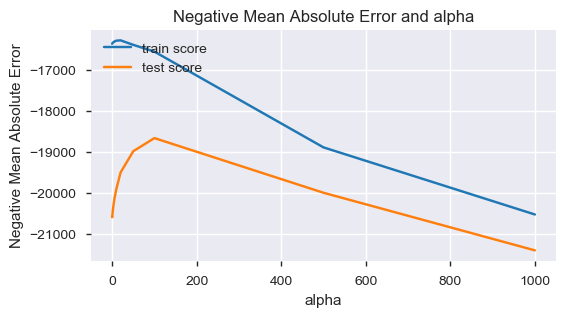

In [125]:
# plotting mean test and train scoes with alpha 
cv_lasso_results['param_alpha'] = cv_lasso_results['param_alpha'].astype('float32')

# plotting
plt.figure(figsize=(6,3))
plt.plot(cv_lasso_results['param_alpha'], cv_lasso_results['mean_train_score'])
plt.plot(cv_lasso_results['param_alpha'], cv_lasso_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper left')
plt.show()

 Data Interpretation of Lasso Regression 
- Larger the Negative Mean Absolute Error the better
- As the value of Alpha (coefficient of the regularization term) increases the emphasis on accuracy of the model reduces and hence model could make more errors.
- The Train score dips with the increasing value of alpha.
- Initially for small values of alpha the test score is good and then reduces.

**The alpha parameter in Scikit-Learn is nothing but theory lambda**<br/>
 **The test curve is peaking around 100 and that is the value of alpha value chosen for Lasso Regression** 

In [126]:
alpha =100

lasso = Lasso(alpha=alpha)
        
lasso.fit(X_train, y_train) 

Lasso(alpha=100, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False)

In [127]:
lasso.coef_

array([-1.63549095e+00,  0.00000000e+00,  1.45289216e+04,  9.92212011e+04,
        2.95099727e+04,  1.49914870e+04,  1.48444891e+04,  2.60581495e+04,
        2.85076612e+04,  2.28179115e+04, -0.00000000e+00,  3.07830454e+04,
        1.07628123e+03,  0.00000000e+00,  1.83365780e+05,  1.34569219e+04,
        1.24147042e+04,  1.03379025e+04, -0.00000000e+00,  2.54307488e+04,
        3.00563534e+02,  1.17389058e+04,  3.76517298e+04,  0.00000000e+00,
        8.26196590e+03, -2.54134022e+01, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -4.04288653e+03,  1.48686587e+03,  0.00000000e+00,
       -2.20733218e+04, -2.94633042e+02, -7.82569984e+03, -1.13460643e+04,
       -1.21962297e+04, -7.60929246e+03,  0.00000000e+00,  2.35704725e+03,
       -2.90753368e+03, -2.11629853e+03, -4.39057155e+03, -0.00000000e+00,
       -0.00000000e+00,  1.49461090e+04,  0.00000000e+00,  3.91940397e+02,
       -7.58269629e+02, -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00, -

 Data Interpretation of Lasso Regression 
- A lot of coefficients are exactly to zero
- The irrelevant coeffients are clamped down to a zero value

<a id="evaluation"></a>
# 6. Predictions and Evaluation on the Test Set 

In [128]:
X_test[scaled_features] = scaler.transform(X_test[scaled_features])

### Predictions using Linear Regression Model Built Using StatsModel

Mean Square Error: 1602034729.6437156
Test Data Set R-squared: 0.751110525114269


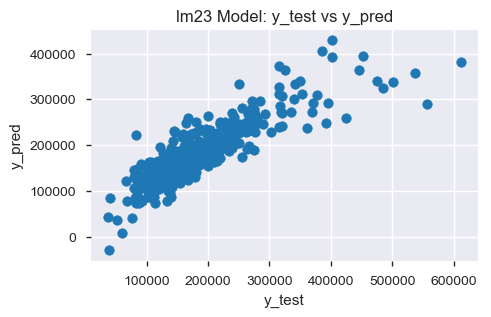

In [129]:
X_test_sm = sm.add_constant(X_test[feature_cols])

y_test_pred = lm_23.predict(X_test_sm)
print("Mean Square Error:", mean_squared_error(y_test, y_test_pred))
print("Test Data Set R-squared:", r2_score(y_true = y_test, y_pred = y_test_pred))
plt.figure(figsize=(5,3))
plt.scatter(y_test,y_test_pred)
plt.title('lm23 Model: y_test vs y_pred')     
plt.xlabel('y_test') 
plt.ylabel('y_pred')    
plt.show()

 Data Interpretation on Model lm_23 
 + The trained model had **R2 of 75%** and adjusted R2 of 74.9%
 + The test model gave an **R2 score of 75.11%** which is a close fit and signifies that **lm_23 is a good fit**.

Text(0, 0.5, 'Sale Price')

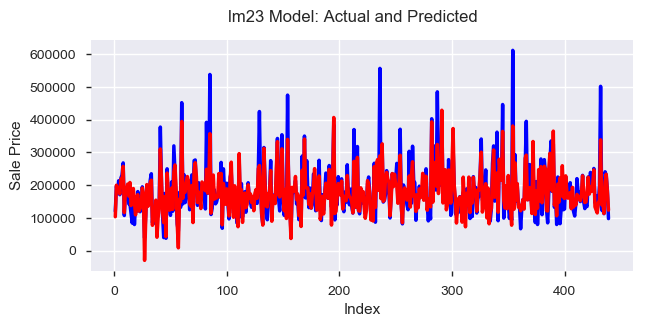

In [130]:
#Actual vs Predicted
c = [i for i in range(1,len(y_test)+1,1)]
fig = plt.figure(figsize=(7,3))
plt.plot(c,y_test, color="blue", linewidth=2.5, linestyle="-")
plt.plot(c,y_test_pred, color="red",  linewidth=2.5, linestyle="-")
fig.suptitle('lm23 Model: Actual and Predicted')  
plt.xlabel('Index')    
plt.ylabel('Sale Price')  

### Predictions using Ridge Regression

In [131]:
# predict
y_train_pred = ridge.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = ridge.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.8727744094925068
0.8626661138297269


 Data Interpretation of Ridge Regression Predictions 
- The R2 score of both train and test is high and approximately same.

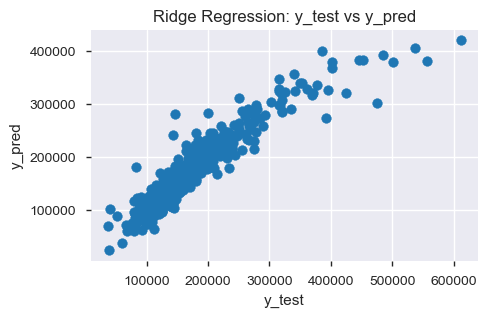

In [132]:
plt.figure(figsize=(5,3))
plt.scatter(y_test,y_test_pred)
plt.title('Ridge Regression: y_test vs y_pred')     
plt.xlabel('y_test') 
plt.ylabel('y_pred')    
plt.show()

In [133]:
# ridge model parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -20263.102),
 ('LotFrontage', -1.581),
 ('LotArea', 8547.764),
 ('OverallQual', 19814.321),
 ('OverallCond', 66932.234),
 ('MasVnrArea', 26642.3),
 ('ExterQual', 22547.274),
 ('BsmtQual', 20680.403),
 ('BsmtExposure', 29473.18),
 ('BsmtFinSF1', 28720.78),
 ('BsmtUnfSF', 26407.368),
 ('TotalBsmtSF', 5312.155),
 ('HeatingQC', 34354.073),
 ('1stFlrSF', 3324.468),
 ('GrLivArea', 35840.649),
 ('BsmtFullBath', 59671.38),
 ('FullBath', 14758.422),
 ('HalfBath', 26759.802),
 ('BedroomAbvGr', 15585.633),
 ('KitchenQual', -651.758),
 ('TotRmsAbvGrd', 26095.411),
 ('Fireplaces', 26252.39),
 ('GarageCars', 17646.164),
 ('GarageArea', 30158.028),
 ('WoodDeckSF', 16696.126),
 ('OpenPorchSF', 11491.043),
 ('MoSold', -2563.69),
 ('GarageBltAge', -791.699),
 ('PropertyAge', -3.017),
 ('PropertyRemodAddAge', -2584.825),
 ('SaleAge', -7999.982),
 ('Has2ndFlr', 3005.101),
 ('HasBsmt', 9177.225),
 ('HasGarage', -18847.749),
 ('BldgType_2fmCon', -3610.492),
 ('BldgType_Duplex', -11902.27),
 ('

### Predictions using Lasso Regression

In [134]:
# predict
y_train_pred = lasso.predict(X_train)
print(metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
y_test_pred = lasso.predict(X_test)
print(metrics.r2_score(y_true=y_test, y_pred=y_test_pred))

0.8747229409976686
0.8622306924102736


 Data Interpretation of Lasso Regression Predictions 
- The R2 score of both train and test is high and approximately same.

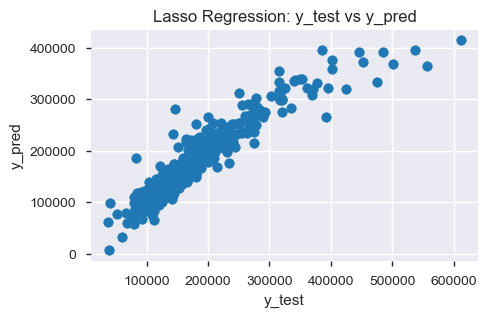

In [135]:
plt.figure(figsize=(5,3))
plt.scatter(y_test,y_test_pred)
plt.title('Lasso Regression: y_test vs y_pred')     
plt.xlabel('y_test') 
plt.ylabel('y_pred')    
plt.show()

In [136]:
# lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -22174.717),
 ('LotFrontage', -1.635),
 ('LotArea', 0.0),
 ('OverallQual', 14528.922),
 ('OverallCond', 99221.201),
 ('MasVnrArea', 29509.973),
 ('ExterQual', 14991.487),
 ('BsmtQual', 14844.489),
 ('BsmtExposure', 26058.149),
 ('BsmtFinSF1', 28507.661),
 ('BsmtUnfSF', 22817.911),
 ('TotalBsmtSF', -0.0),
 ('HeatingQC', 30783.045),
 ('1stFlrSF', 1076.281),
 ('GrLivArea', 0.0),
 ('BsmtFullBath', 183365.78),
 ('FullBath', 13456.922),
 ('HalfBath', 12414.704),
 ('BedroomAbvGr', 10337.903),
 ('KitchenQual', -0.0),
 ('TotRmsAbvGrd', 25430.749),
 ('Fireplaces', 300.564),
 ('GarageCars', 11738.906),
 ('GarageArea', 37651.73),
 ('WoodDeckSF', 0.0),
 ('OpenPorchSF', 8261.966),
 ('MoSold', -25.413),
 ('GarageBltAge', -0.0),
 ('PropertyAge', -0.0),
 ('PropertyRemodAddAge', -0.0),
 ('SaleAge', -4042.887),
 ('Has2ndFlr', 1486.866),
 ('HasBsmt', 0.0),
 ('HasGarage', -22073.322),
 ('BldgType_2fmCon', -294.633),
 ('BldgType_Duplex', -7825.7),
 ('BldgType_Twnhs', -11346.064),
 ('BldgType_T

Even for a small value of alpha, a significant number of coefficients are zero. Lasso Regression Model is more advantageous than Ridge Regression Model.